# Sprint 7

# Tasca M7 T01

Comenzamos importando todas las librerías y leyendo los archivos de wineData.txt y copiando los datos de wineNames.txt para convertirlos en un dataframe de Pandas.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('wineData.txt',  index_col=None, header=None)
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


In [3]:
df.columns = ['class','alcohol', 'malic_acid', 'ash', 'alcalinity_of_ash', 'magnesium',
       'total_phenols', 'flavanoids', 'nonflavanoid_phenols',
       'proanthocyanins', 'color_intensity', 'hue',
       'od280/od315_of_diluted_wines', 'proline']

Los nombres de las columnas significan lo siguiente:

* **class**: Clase o tipo de vino. Representa la categoría a la que pertenece el vino (1, 2 o 3).
* **alcohol**: Contenido de alcohol en el vino. Mide el porcentaje de alcohol presente en el vino.
* **malic_acid**: Ácido málico. Es un ácido orgánico presente en el vino.
* **ash**: Cenizas. Representa la cantidad de cenizas resultantes de la quema de los componentes orgánicos en el vino.
* **alcalinity_of_ash**: Alcalinidad de las cenizas. Indica el nivel de alcalinidad presente en las cenizas del vino.
* **magnesium**: Magnesio. Es un mineral presente en el vino.
* **total_phenols**: Fenoles totales. Representa la cantidad total de compuestos fenólicos presentes en el vino.
* **flavanoids**: Flavonoides. Son compuestos fenólicos presentes en el vino que aportan características organolépticas y beneficios para la salud.
* **nonflavanoid_phenols**: Fenoles no flavonoides. Representa la cantidad de compuestos fenólicos que no son flavonoides en el vino.
* **proanthocyanins**: Proantocianidinas. Son compuestos fenólicos presentes en el vino con propiedades antioxidantes.
* **color_intensity**: Intensidad de color. Mide la intensidad del color del vino.
* **hue**: Tono. Representa la tonalidad del color del vino.
* **od280/od315_of_diluted_wines**: Relación OD280/OD315 de vinos diluidos. Es una medida de absorbancia utilizada para evaluar la calidad del vino.
* **proline**: Prolina. Es un aminoácido presente en el vino y se utiliza como un indicador de la calidad del vino.

Estas columnas representan diferentes características y propiedades químicas del vino que se utilizan en el conjunto de datos para realizar análisis y predicciones.

## Exploración

En esta etapa comenzaremos a usar la librería `ydata`. 

In [4]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df,title="Vinos")

In [5]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

El reporte generado por `ydata` proporciona información detallada sobre el conjunto de datos. En la sección de Overview, se observa que hay 14 variables con 178 observaciones. No se encuentran valores nulos y el tamaño en memoria es de 19.6 KiB. Además, se indica que hay 1 variable categórica y 13 variables numéricas. También se incluye una pestaña que muestra todas las correlaciones y su grado entre las variables.

Adicionalmente, el reporte ofrece un resumen estadístico detallado por variable, acompañado de histogramas que permiten visualizar la distribución de los valores. Sin embargo, solo se pueden identificar valores atípicos en tres variables, por lo que se realizará un análisis más exhaustivo posteriormente.

Asimismo, se proporciona una gráfica de puntos interactiva que muestra todas las posibles relaciones entre las variables. Además, se incluye un mapa de calor con una tabla de correlación, que confirma la información presentada en la sección de Overview.

Finalmente, el reporte incluye una gráfica de barras que confirma la ausencia de valores faltantes, así como un dataframe con los datos del conjunto de datos analizado.

In [6]:
profile.to_file('Reporte_Vinos.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Adjunto se agrega el archivo del reporte en formato HTML para asegurar que la información esté disponible, incluso si hay problemas al visualizarlo en Github.

<Axes: >

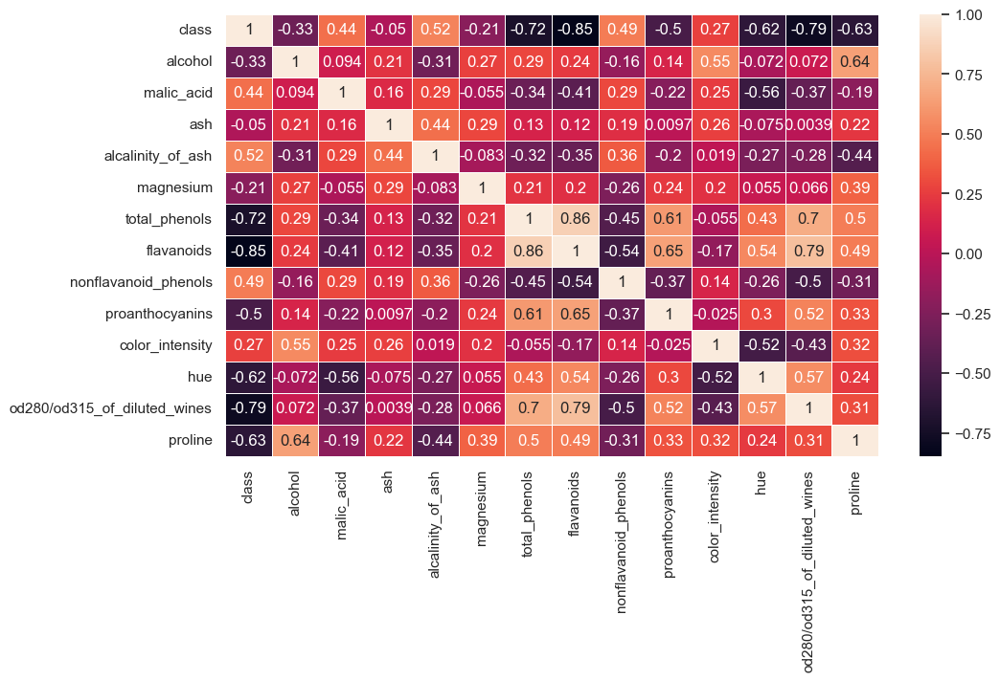

In [7]:
 %matplotlib inline
sns.set_theme()

f, ax = plt.subplots(figsize=(11, 6))
sns.heatmap(df.corr(numeric_only=True), annot=True, linewidths=.5, ax=ax)


El mapa de calor proporciona una representación visual más clara de las correlaciones entre las variables, incluyendo sus valores, lo cual no se mostraba en la tabla del informe generado por `ydata`.

Utilizando este gráfico y el _overview_, observamos que las variables tienen una fuerte correlación entre sí de la siguiente manera:

La variable **class** muestra una correlación negativa muy alta con 5 variables: proline (-0.63), od280/od315 (-0.79), hue (-0.62), flavanoids (-0.85), total_phenols (-0.72).

La variable **od280/od135** presenta una correlación muy alta con 5 variables: flavanoids (0.79), total_phenols (-0.70), magnesium (0.66), alcohol (0.72) y class (-0.79).

La variable **flavanoids** muestra principalmente una correlación positiva y muy alta con 4 variables: od280/od135 (0.79), proanthocyanins (0.65), total_phenols (0.86), class (-0.85).

La variable **total_phenols** muestra principalmente una correlación positiva y muy alta con 4 variables: od280/od135 (0.70), proanthocyanins (0.61), flavanoids (0.86), total_phenols (-0.72).

La variable **alcohol** presenta principalmente una correlación positiva y muy alta con 3 variables: proline (0.64), od280/od135 (0.72), hue (-0.72).

La variable **hue** muestra una correlación negativa muy alta con 2 variables: hue (-0.72), class (-0.62).

La variable **proanthocyanins** presenta una correlación positiva muy alta con 2 variables: flavanoids (0.65), total_phenols (0.61).

La variable **proline** muestra una correlación positiva y negativa muy alta con 2 variables: alcohol (0.64), class (-0.63).

In [8]:
pd.options.display.float_format = '{:.2f}'.format
df.describe().T

,count,mean,std,min,25%,50%,75%,max
class,178.00,1.94,0.78,1.00,1.00,2.00,3.00,3.00
alcohol,178.00,13.00,0.81,11.03,12.36,13.05,13.68,14.83
malic_acid,178.00,2.34,1.12,0.74,1.60,1.87,3.08,5.80
ash,178.00,2.37,0.27,1.36,2.21,2.36,2.56,3.23
alcalinity_of_ash,178.00,19.49,3.34,10.60,17.20,19.50,21.50,30.00
magnesium,178.00,99.74,14.28,70.00,88.00,98.00,107.00,162.00
total_phenols,178.00,2.30,0.63,0.98,1.74,2.35,2.80,3.88
flavanoids,178.00,2.03,1.00,0.34,1.21,2.13,2.88,5.08
nonflavanoid_phenols,178.00,0.36,0.12,0.13,0.27,0.34,0.44,0.66
proanthocyanins,178.00,1.59,0.57,0.41,1.25,1.56,1.95,3.58


La tabla de resumen estadístico revela que el _count_ de todas las variables es de 178, lo cual confirma lo observado anteriormente en el informe generado por `ydata`, donde se indica que no existen valores nulos en los datos. Es importante destacar que la variable **class** es categórica y representa los diferentes tipos de vinos, por lo tanto, no será analizada.

Así mismo, se observan diferencias significativas en las características y distribuciones de los datos en cada variable. Algunas variables presentan una variabilidad más alta, mientras que otras tienen una variación más baja. Estas diferencias pueden ser el resultado de la naturaleza de la variable, unidades de medida distintas o variaciones inherentes en los datos.

* La variable **malic_acid** tiene una media de 2.34 y una desviación estándar de 1.12. Los valores varían entre 0.74 y 5.80, lo que indica una amplia dispersión en los niveles de ácido málico.

* La variable **alcalinity_of_ash** muestra una media de 19.49 y una desviación estándar de 3.34. Los valores oscilan entre 10.60 y 30.00, lo que indica una amplia variabilidad en la alcalinidad de las cenizas.

* La variable **magnesium** presenta una media de 99.74, con una desviación estándar de 14.28. Los valores varían entre 70.00 y 162.00, lo que indica una amplia variación en los niveles de magnesio.

* La variable **flavanoids** muestra una media de 2.03 y una desviación estándar de 1.00. Los valores oscilan entre 0.34 y 5.08, lo que indica una amplia variabilidad en los niveles de flavonoides.

* La variable **color_intensity** muestra una media de 5.06 y una desviación estándar de 2.32. Los valores oscilan entre 1.28 y 13.00, lo que indica una amplia variabilidad en la intensidad del color.

* La variable **proline** muestra una media de 746.89 y una desviación estándar de 314.91. Los valores oscilan entre 278.00 y 1680.00, lo que indica una amplia variación en los niveles de proline.

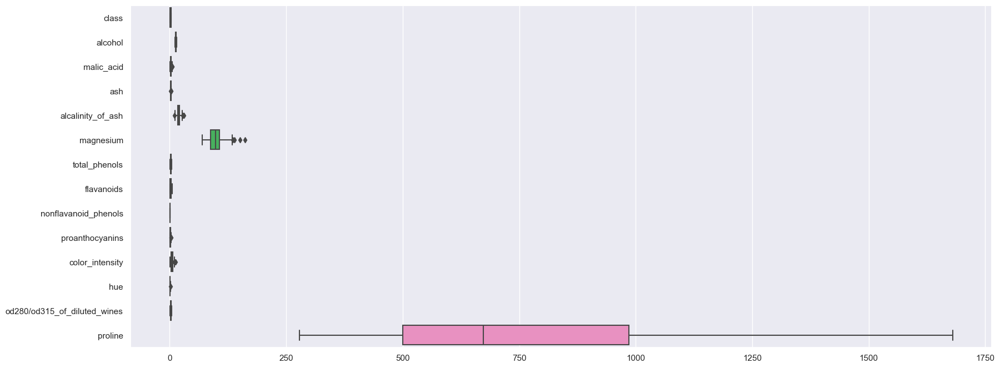

In [9]:
sns.set()
fig, ax = plt.subplots(figsize=(20, 8))
ax = sns.boxplot(data=df, orient='h')

El gráfico de boxplot revela claramente las diferencias entre las variables. En particular, destaca que las variables **proline** y **magnesium** exhiben valores considerablemente más altos, lo que puede ocultar visualmente las variables con valores más pequeños.

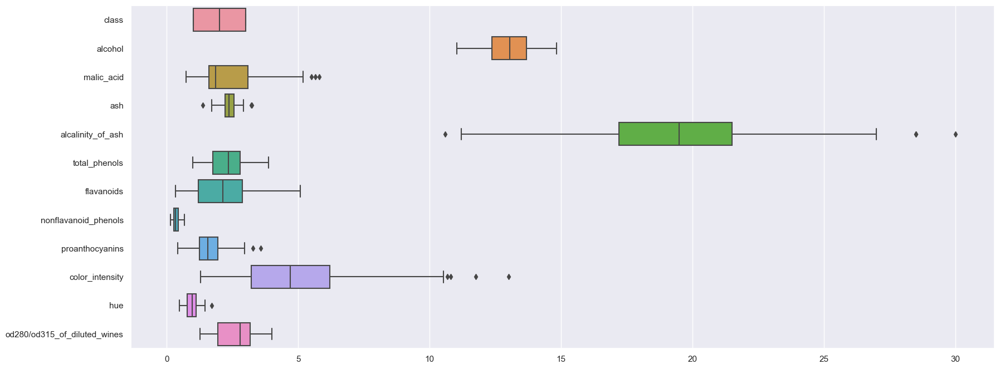

In [10]:
sns.set()
fig, ax = plt.subplots(figsize=(20, 8))
ax = sns.boxplot(data=df[['class', 'alcohol', 'malic_acid', 'ash', 'alcalinity_of_ash',
       'total_phenols', 'flavanoids', 'nonflavanoid_phenols',
       'proanthocyanins', 'color_intensity', 'hue',
       'od280/od315_of_diluted_wines']], orient='h')

Con el fin de obtener una visualización más clara de todas variables, se ha creado una gráfica con las variables con valores más pequeños que revela de manera evidente que las variables **malic_acid, ash, alcalinity_of_ash, proanthocyanins, color_intensity** y **hue** presentan valores atípicos junto con **magnesium** que ya habíamos visto en el grafico anterior.

Por otro lado, las variables **total_phenols, flavanoids, nonflavanoid_phenols** y **od280/od315_of_diluted_wines** no cuentan con valores atípicos al igual que **proline**.

Cabe destacar que la variable **class** es una variable categórica ordinal, por lo que tampoco se considera la presencia de valores atípicos.

## Preprocesamiento

Realizamos una visualización rápida de los tipos de datos presentes en el conjunto de datos y posteriormente los convertimos todos a tipo float. Esta conversión nos permitirá revisar si alguna de las variables sigue una distribución gaussiana.

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   class                         178 non-null    int64  
 1   alcohol                       178 non-null    float64
 2   malic_acid                    178 non-null    float64
 3   ash                           178 non-null    float64
 4   alcalinity_of_ash             178 non-null    float64
 5   magnesium                     178 non-null    int64  
 6   total_phenols                 178 non-null    float64
 7   flavanoids                    178 non-null    float64
 8   nonflavanoid_phenols          178 non-null    float64
 9   proanthocyanins               178 non-null    float64
 10  color_intensity               178 non-null    float64
 11  hue                           178 non-null    float64
 12  od280/od315_of_diluted_wines  178 non-null    float64
 13  proli

In [12]:
df[['class', 'magnesium', 'proline']] = df[['class', 'magnesium', 'proline']].astype('float')

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   class                         178 non-null    float64
 1   alcohol                       178 non-null    float64
 2   malic_acid                    178 non-null    float64
 3   ash                           178 non-null    float64
 4   alcalinity_of_ash             178 non-null    float64
 5   magnesium                     178 non-null    float64
 6   total_phenols                 178 non-null    float64
 7   flavanoids                    178 non-null    float64
 8   nonflavanoid_phenols          178 non-null    float64
 9   proanthocyanins               178 non-null    float64
 10  color_intensity               178 non-null    float64
 11  hue                           178 non-null    float64
 12  od280/od315_of_diluted_wines  178 non-null    float64
 13  proli

In [14]:
from scipy.stats import shapiro

resultados = [shapiro(df[col])[1] > 0.05 for col in df.select_dtypes(include=['float64']).columns]
print(resultados)

[False, False, False, False, True, False, False, False, False, False, False, False, False, False]


In [15]:
stat, p = shapiro(df['alcalinity_of_ash'])
print('stat=%.3f, p=%.3f' % (stat, p))
alpha = 0.05
if p > alpha:
    print('Los datos de Alcalinity of Ash siguen una distribución normal. Por lo tanto, no se rechaza la Hipótesis Nula (H0).')
else: 
    print('Los datos de Alcalinity of Ash  no siguen una distribución normal. Por lo tanto, se rechaza la Hipótesis Nula (H0).')

stat=0.990, p=0.264
Los datos de Alcalinity of Ash siguen una distribución normal. Por lo tanto, no se rechaza la Hipótesis Nula (H0).


Durante la búsqueda de variables que pudieran seguir una distribución gaussiana, se observó que la variable **alcalinity of ash** podría ajustarse a esta distribución. 

Para verificar esta suposición, se realizó el test de Shapiro únicamente en esta variable y, efectivamente, se confirmó que sigue una distribución gaussiana.

## Estandarización y Normalización


Esta parte del preprocesamiento se realizará en tres etapas diferentes.

En primer lugar, importaremos las librerías de StandardScaler, MinMaxScaler y RobustScaler para aplicarlas de la siguiente manera:

1. La variable **alcalinity_of_ash**, al tener una distribución gaussiana, se escalará utilizando StandardScaler.

2. Las variables sin outliers se escalarán utilizando MinMaxScaler.

3. Las variables con outliers se escalarán utilizando RobustScaler.

In [16]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler

**Standard Scaler**

In [17]:
column_normalizadas = ['alcalinity_of_ash']

scaling = StandardScaler()
df[column_normalizadas] = scaling.fit_transform(df[column_normalizadas])

**MinMax Scaler**

In [18]:
columns_sin_outliers = ['alcohol', 'total_phenols', 'flavanoids', 'nonflavanoid_phenols','od280/od315_of_diluted_wines', 
                        'proline']

scaling = MinMaxScaler()
df[columns_sin_outliers] = scaling.fit_transform(df[columns_sin_outliers])

**Robust Scaler**

In [19]:
columns_con_outliers = ['malic_acid', 'ash', 'magnesium', 'proanthocyanins',
                        'color_intensity', 'hue']

scaling = RobustScaler()
df[columns_con_outliers] = scaling.fit_transform(df[columns_con_outliers])

Una vez aplicadas las escalas a todo el conjunto de datos, realizamos una visualización utilizando un gráfico de boxplot.

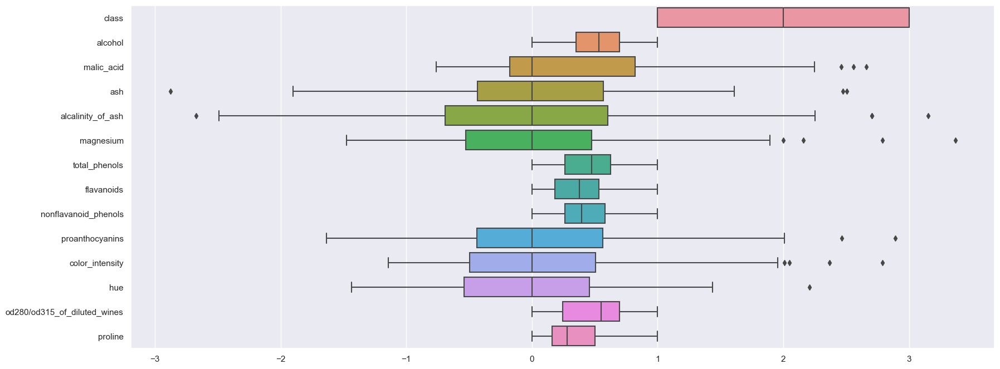

In [20]:
sns.set()
fig, ax = plt.subplots(figsize=(20, 8))
ax = sns.boxplot(data=df, orient='h')

El gráfico muestra claramente la diferencia entre las variables después de aplicar las escalas. 

Observamos que las variables sin outliers están distribuidas en el rango de 0 a 1, mientras que las variables con outliers se encuentran mayormente concentradas alrededor de 0. 

La variable **class** no ha sido escalada y muestra valores entre 1 y 3, ya que representa el target y no se incluye en el proceso de escalamiento.

## Train - Test Split

In [21]:
from sklearn.model_selection import train_test_split

X = df.drop('class', axis=1)
y = df['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

In [22]:
print(len(X_test) == len(y_test))
print(len(X_train) == len(y_train))

True
True


Luego de realizar la estandarización y normalización de los datos, se procedió a dividir el dataframe en dos variables: "X" y "y". 

La variable "X" contiene las variables independientes, que incluyen **alcohol, malic_acid, ash, alcalinity_of_ash, magnesium, total_phenols, flavanoids, nonflavanoid_phenols, proanthocyanins, color_intensity, hue, od280/od315_of_diluted_wines** y **proline** y la variante _y_ que es el target **class**.

Por otro lado, la variable _y_ representa el objetivo o target, que es la variable **class**.

## Ejercicio 1

Crea al menos dos modelos de clasificación diferentes para intentar predecir de la mejor manera las clases del archivo adjunto.

### Modelo 1 - Regresión Logística

In [23]:
from sklearn.linear_model import LogisticRegression

In [24]:
lr = LogisticRegression()
lr.fit(X_train, y_train)

LogisticRegression()

In [25]:
lr.predict(X_test)

array([2., 2., 1., 2., 1., 2., 2., 1., 3., 1., 1., 2., 1., 3., 2., 2., 2.,
       2., 2., 3., 1., 3., 1., 1., 2., 3., 2., 3., 2., 2., 3., 3., 2., 3.,
       2., 1.])

In [26]:
lr.score(X_test, y_test)

0.9722222222222222

Para el modelo 1 se utilizó la Regresión Logística que se basa en la función logística para predecir la probabilidad de que una instancia pertenezca a una determinada clase.

Primero, se implementó el modelo al conjunto de datos de entrenamiento de las variables _X_train_ y _y_train_ para encontrar una relación entre las variables y las clases. 

Posteriormente, se evaluo su rendimiento usando el conjunto de datos _X_test_ para hacer predicciones para cada instancia. Estas predicciones se basaron en la probabilidad estimada de pertenecer a cada clase, y se asignó la clase con la probabilidad más alta como la predicción final.

Finalmente, se calculó la tasa de clasificación correcta que obtuvo una alta precisión de **97.22%** en la clasificación de las instancias en el conjunto de prueba.

El modelo de Regresión Logística utilizado en este estudio demostró ser efectivo en la clasificación de las instancias del conjunto de prueba. 

### Modelo 2 - Support Vector Machine

In [27]:
from sklearn.svm import SVC

In [28]:
svc = SVC()
svc.fit(X_train, y_train)

SVC()

In [29]:
svc.predict(X_test)

array([2., 2., 1., 2., 1., 2., 2., 1., 3., 1., 1., 2., 1., 2., 2., 2., 3.,
       2., 2., 3., 1., 3., 1., 1., 2., 3., 2., 3., 2., 2., 3., 3., 2., 3.,
       2., 1.])

In [30]:
svc.score(X_test, y_test)

0.9722222222222222

Para el modelo 2 se utilizó el Support Vector Machine (Máquina de Vectores de Soporte) que se basa en la construcción de hiperplanos óptimos para separar los datos de diferentes clases en un espacio de alta dimensionalidad. 

Primero, se implementó el modelo al conjunto de datos de entrenamiento de las variables _X_train_ y _y_train_ para encontrar una relación entre las variables y las clases. 

Posteriormente, se evaluo su rendimiento usando el conjunto de datos _X_test_ para hacer predicciones para cada instancia. Estas predicciones se basaron en la probabilidad estimada de pertenecer a cada clase, y se asignó la clase con la probabilidad más alta como la predicción final.

Finalmente, se calculó la tasa de clasificación correcta que obtuvo una alta precisión de **97.22%** en la clasificación de las instancias en el conjunto de prueba.

El modelo de Support Vector Machine (Máquina de Vectores de Soporte) utilizado en este estudio demostró ser efectivo en la clasificación de las instancias del conjunto de prueba. 

#### Observaciones Modelos 1 y 2

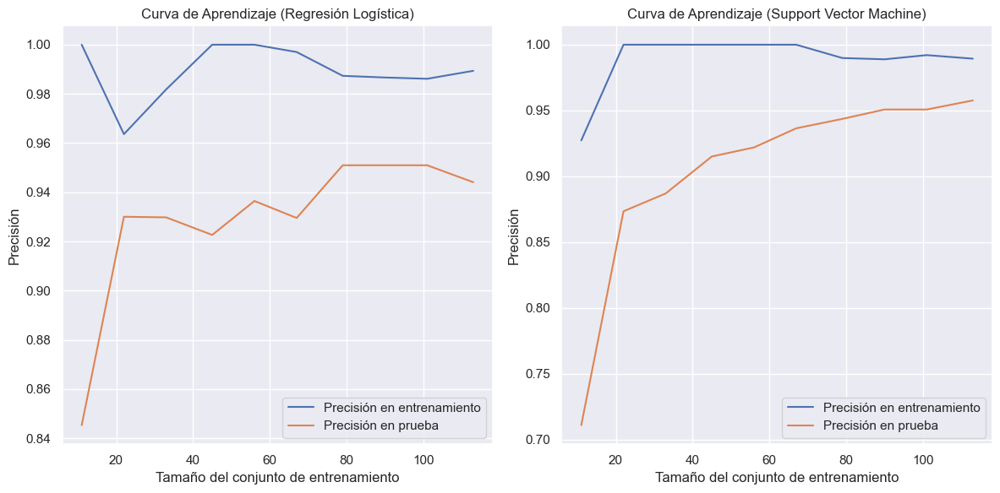

In [31]:
from sklearn.model_selection import learning_curve

# Curva de Aprendizaje para Regresión Logística
train_sizes = np.linspace(0.1, 1.0, 10)
train_sizes_abs, train_scores, test_scores = learning_curve(lr, X_train, y_train, train_sizes=train_sizes, cv=5)
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# Curva de Aprendizaje para Support Vector Machine (SVM)
train_sizes_abs_svc, train_scores_svc, test_scores_svc = learning_curve(svc, X_train, y_train, train_sizes=train_sizes, cv=5)
train_mean_svc = np.mean(train_scores_svc, axis=1)
test_mean_svc = np.mean(test_scores_svc, axis=1)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Primera subfigura: Curva de Aprendizaje para Regresión Logística
axes[0].plot(train_sizes_abs, train_mean, label='Precisión en entrenamiento')
axes[0].plot(train_sizes_abs, test_mean, label='Precisión en prueba')
axes[0].set_xlabel('Tamaño del conjunto de entrenamiento')
axes[0].set_ylabel('Precisión')
axes[0].set_title('Curva de Aprendizaje (Regresión Logística)')
axes[0].legend()

# Segunda subfigura: Curva de Aprendizaje para Support Vector Machine (SVM)
axes[1].plot(train_sizes_abs_svc, train_mean_svc, label='Precisión en entrenamiento')
axes[1].plot(train_sizes_abs_svc, test_mean_svc, label='Precisión en prueba')
axes[1].set_xlabel('Tamaño del conjunto de entrenamiento')
axes[1].set_ylabel('Precisión')
axes[1].set_title('Curva de Aprendizaje (Support Vector Machine)')
axes[1].legend()

plt.tight_layout() 
plt.show()

Ambos modelos, la Regresión Logística y el Support Vector Machine, lograron una tasa de clasificación correcta del **97.22%**, lo cual indica un alto nivel de precisión.

No obstante, al analizar la gráfica de la curva de aprendizaje, se observa que el modelo 2 basado en el Support Vector Machine presenta resultados superiores. En este caso, el modelo SVM muestra una mejora más significativa a medida que aumenta el tamaño del conjunto de entrenamiento, lo cual indica una mejor capacidad de generalización y un menor riesgo de sobreajuste en comparación con el modelo de Regresión Logística.

### Modelo 3 - KNN

In [32]:
from sklearn.neighbors import KNeighborsClassifier

In [33]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [34]:
knn.predict(X_test)

array([1., 2., 1., 2., 1., 2., 2., 1., 3., 1., 1., 1., 1., 2., 2., 2., 3.,
       1., 2., 3., 1., 3., 1., 1., 2., 3., 2., 3., 2., 2., 3., 3., 2., 3.,
       2., 1.])

In [35]:
knn.score(X_test, y_test)

0.8888888888888888

Para el modelo 3 se utilizó el KNeighbors Classifier que se basa en el algoritmo de clasificación conocido como "K vecinos más cercanos". Este algoritmo se fundamenta en la idea de que los puntos de datos similares tienden a pertenecer a la misma clase.

Primero, se implementó el modelo al conjunto de datos de entrenamiento de las variables X_train y y_train para encontrar una relación entre las variables y las clases.

Posteriormente, se evaluo su rendimiento usando el conjunto de datos X_test para hacer predicciones para cada instancia. Estas predicciones se basaron en la probabilidad estimada de pertenecer a cada clase, y se asignó la clase con la probabilidad más alta como la predicción final.

Finalmente, se calculó la tasa de clasificación correcta que obtuvo una alta precisión de **88.88** en la clasificación de las instancias en el conjunto de prueba.

El modelo de KNeighbors Classifier utilizado en este estudio demostró ser efectivo en la clasificación de las instancias del conjunto de prueba.

### Modelo 4 - Decision Tree

In [36]:
from sklearn import tree

In [37]:
dt = tree.DecisionTreeClassifier()
dt.fit(X_train, y_train)

DecisionTreeClassifier()

In [38]:
dt.predict(X_test)

array([2., 2., 1., 2., 1., 2., 2., 1., 3., 1., 1., 2., 1., 3., 2., 2., 3.,
       2., 2., 3., 1., 3., 1., 1., 2., 3., 2., 3., 2., 2., 3., 3., 2., 3.,
       2., 1.])

In [39]:
dt.score(X_test, y_test)

0.9444444444444444

Para el modelo 4 se utilizó el Decision Tree que se basa en el algoritmo de Árbol de Decisión. Este algoritmo se basa en la creación de un modelo de árbol que representa una serie de decisiones y sus posibles consecuencias.

Primero, se implementó el modelo al conjunto de datos de entrenamiento de las variables X_train y y_train para encontrar una relación entre las variables y las clases.

Posteriormente, se evaluo su rendimiento usando el conjunto de datos X_test para hacer predicciones para cada instancia. Estas predicciones se basaron en la probabilidad estimada de pertenecer a cada clase, y se asignó la clase con la probabilidad más alta como la predicción final.

Finalmente, se calculó la tasa de clasificación correcta que obtuvo una alta precisión de 94.44 en la clasificación de las instancias en el conjunto de prueba.

El modelo de Decision Tree utilizado en este estudio demostró ser efectivo en la clasificación de las instancias del conjunto de prueba.

#### Observaciones Modelos 3 y 4

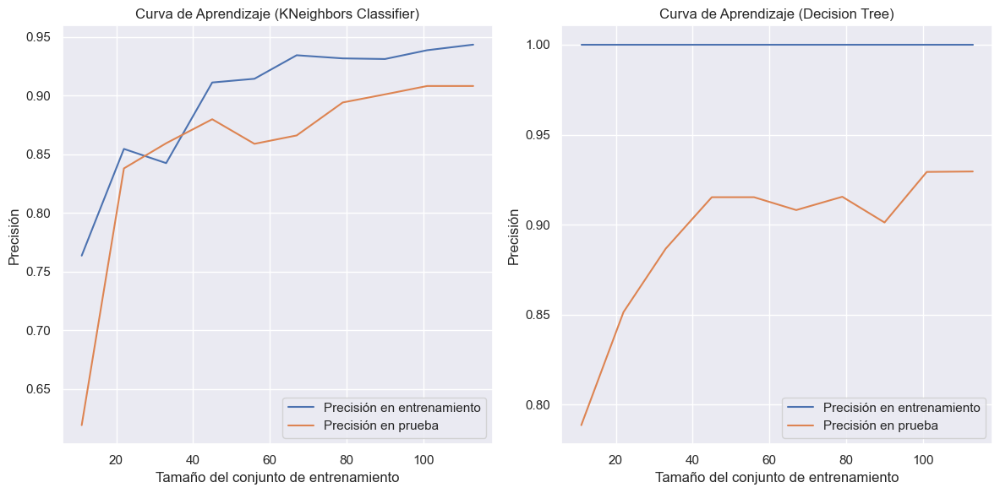

In [40]:
# Curva de Aprendizaje para KNeighbors Classifier
train_sizes_abs_knn, train_scores_knn, test_scores_knn = learning_curve(KNeighborsClassifier(), X_train, y_train, 
                                                                        train_sizes=train_sizes, cv=5)
train_mean_knn = np.mean(train_scores_knn, axis=1)
test_mean_knn = np.mean(test_scores_knn, axis=1)

# Curva de Aprendizaje para Decision Tree
train_sizes_abs_dt, train_scores_dt, test_scores_dt = learning_curve(tree.DecisionTreeClassifier(), X_train, y_train, 
                                                                     train_sizes=train_sizes, cv=5)
train_mean_dt = np.mean(train_scores_dt, axis=1)
test_mean_dt = np.mean(test_scores_dt, axis=1)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Primera subfigura: Curva de Aprendizaje para KNeighbors Classifier
axes[0].plot(train_sizes_abs_knn, train_mean_knn, label='Precisión en entrenamiento')
axes[0].plot(train_sizes_abs_knn, test_mean_knn, label='Precisión en prueba')
axes[0].set_xlabel('Tamaño del conjunto de entrenamiento')
axes[0].set_ylabel('Precisión')
axes[0].set_title('Curva de Aprendizaje (KNeighbors Classifier)')
axes[0].legend()

# Segunda subfigura: Curva de Aprendizaje para Decision Tree
axes[1].plot(train_sizes_abs_dt, train_mean_dt, label='Precisión en entrenamiento')
axes[1].plot(train_sizes_abs_dt, test_mean_dt, label='Precisión en prueba')
axes[1].set_xlabel('Tamaño del conjunto de entrenamiento')
axes[1].set_ylabel('Precisión')
axes[1].set_title('Curva de Aprendizaje (Decision Tree)')
axes[1].legend()

plt.tight_layout() 
plt.show()


El modelo KNN logró una tasa de clasificación correcta del 88.88%, mientras que el Decision Tree alcanzó un 94.44%, lo cual demuestra un alto nivel de precisión en ambos modelos.

Sin embargo, al examinar la curva de aprendizaje, se puede observar que el modelo basado en el Decision Tree (modelo 4) muestra signos de overfitting. Este fenómeno se puede atribuir a diversas causas, entre ellas el tamaño reducido del conjunto de datos de entrenamiento, que en este caso consta de solo 178 observaciones.

Por otro lado, el modelo 3 muestra el mejor rendimiento entre los cuatro modelos según la curva de aprendizaje.

## Ejercicio 2

Compara los modelos de clasificación utilizando la precisión (accuracy), una matriz de confusión y otras métricas más avanzadas.

Importamos todas las librerías necesarias.

In [41]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report

### Modelo 1 - Regresión Logística

**Matriz de Confusión**

In [42]:
y_predicted_lr = lr.predict(X_test)
cm_lr = confusion_matrix(y_test, y_predicted_lr)

In [43]:
pd.DataFrame(cm_lr)

,0,1,2
0,10,0,0
1,0,17,1
2,0,0,8


Al analizar el modelo de Regresión Logística aplicado al conjunto de datos utilizando la matriz de confusión, se obtuvieron los siguientes resultados:

* Clase 0: Se encontraron 10 instancias correctamente clasificadas como verdaderos positivos. No hubo falsos negativos ni falsos positivos.

* Clase 1: Se encontraron 17 instancias correctamente clasificadas como verdaderos positivos. No hubo falsos negativos, pero se identificó 1 falso positivo.

* Clase 2: Se encontraron 8 instancias correctamente clasificadas como verdaderos positivos. No hubo falsos negativos ni falsos positivos.

En resumen, el modelo de Regresión Logística mostró un rendimiento satisfactorio en la clasificación de las instancias en las tres clases evaluadas. La mayoría de las predicciones fueron correctas, con solo un falso positivo identificado en la clase 1. 

**Metricas Avanzadas**

In [44]:
print(classification_report(y_test, y_predicted_lr))

              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00        10
         2.0       1.00      0.94      0.97        18
         3.0       0.89      1.00      0.94         8

    accuracy                           0.97        36
   macro avg       0.96      0.98      0.97        36
weighted avg       0.98      0.97      0.97        36



In [45]:
lr_accuracy = accuracy_score(y_test, y_predicted_lr)
lr_precision = precision_score(y_test, y_predicted_lr, average='macro')
lr_recall = recall_score(y_test, y_predicted_lr, average='macro')
lr_f1 = f1_score(y_test, y_predicted_lr, average='macro')

print('Accuracy del modelo Regresión Logística: ', lr_accuracy)
print('Precisión del modelo Regresión Logística: ', lr_precision)
print('Recall del modelo Regresión Logística: ', lr_recall)
print('F1 del modelo Regresión Logística: ', lr_f1)

Accuracy del modelo Regresión Logística:  0.9722222222222222
Precisión del modelo Regresión Logística:  0.9629629629629629
Recall del modelo Regresión Logística:  0.9814814814814815
F1 del modelo Regresión Logística:  0.9708683473389357


Las metricas del modelo de Regresión Logística muestran lo siguiente:

Métricas por clase:

* Para la clase 1.0, se obtuvo una precisión, recall y f1-score perfectos, todos con un valor de 1.00. Esto significa que todas las instancias de la clase 1.0 fueron correctamente identificadas por el modelo, sin errores de clasificación.
* Para la clase 2.0, se logró una precisión de 1.00, lo que indica que el modelo clasificó correctamente el 100% de las instancias predichas como clase 2.0. El recall obtuvo un valor de 0.94, lo que sugiere que hubo un pequeño número de instancias de clase 2.0 que no fueron detectadas. El f1-score, que combina la precisión y el recall, fue de 0.97 para esta clase.
* Para la clase 3.0, la precisión fue de 0.89, lo que indica que hubo algunas instancias predichas incorrectamente como clase 3.0. Sin embargo, el recall obtuvo un valor perfecto de 1.00, lo que sugiere que todas las instancias reales de la clase 3.0 fueron identificadas correctamente por el modelo. El f1-score fue de 0.94 para esta clase.

Métricas generales:

* La exactitud (accuracy) del modelo fue de 0.97, lo que significa que el 97% de todas las instancias fueron clasificadas correctamente.
* En promedio, el modelo obtuvo un rendimiento balanceado (macro avg) con una precisión, recall y f1-score de 0.96, 0.98 y 0.97, respectivamente. Esto indica que el modelo fue capaz de clasificar adecuadamente las instancias de las diferentes clases de manera equilibrada.
* En promedio, ponderado por el soporte de cada clase (weighted avg), el modelo obtuvo una precisión, recall y f1-score de 0.98, 0.97 y 0.97, respectivamente. Esto indica que el modelo tuvo un buen desempeño en general, teniendo en cuenta el número de instancias de cada clase.

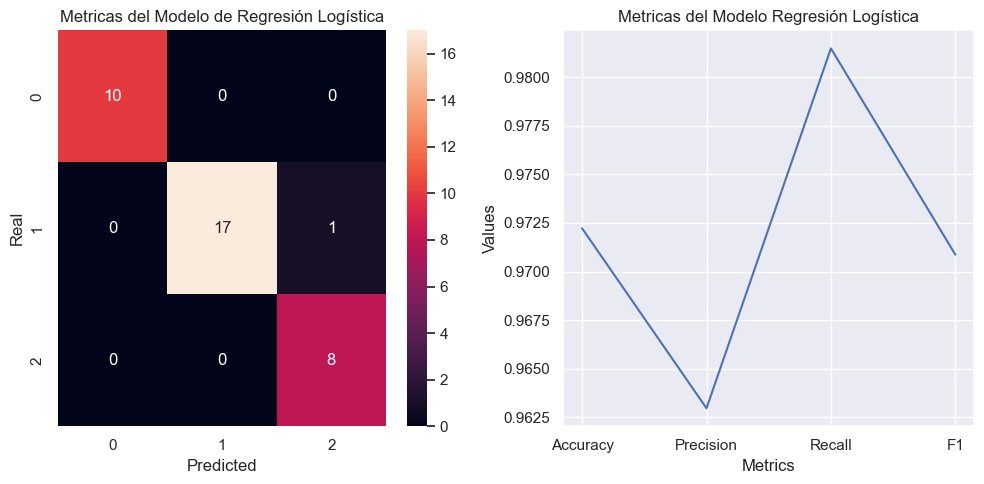

In [46]:
plt.figure(figsize=(10, 5))

metrics = ['Accuracy', 'Precision', 'Recall', 'F1']
lr_metrics = pd.DataFrame({'Metrics': metrics, 'Values': [lr_accuracy, lr_precision, lr_recall, lr_f1]})


# Gráfico de mapa de calor
plt.subplot(1, 2, 1)
sns.heatmap(cm_lr, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Real')
plt.title('Metricas del Modelo de Regresión Logística')

# Gráfico de barras
plt.subplot(1, 2, 2)
sns.lineplot(data=lr_metrics, x='Metrics', y='Values')
plt.title('Metricas del Modelo Regresión Logística')

plt.tight_layout()
plt.show()

**Mapa de calor**: Representa la matriz de confusión del modelo de Regresión Logística. Cada celda del mapa de calor muestra la cantidad de instancias clasificadas correctamente o incorrectamente. Esto nos brinda una visión visual de cómo el modelo realiza las predicciones en función de las clases reales. El mapa de calor nos permite identificar patrones y áreas de mejora en la clasificación.

**Gráfico de barras**: Muestra las métricas del modelo (Accuracy, Precisión, Recall y F1-score) en un formato de gráfico de barras. Cada métrica se representa en el eje x, mientras que los valores correspondientes se muestran en el eje y. Este gráfico nos permite comparar fácilmente el rendimiento del modelo en cada métrica y comprender rápidamente las fortalezas y debilidades del modelo.

### Modelo 2 - Support Vector Machine

**Matriz de Confusión**

In [47]:
y_predicted_svc = svc.predict(X_test)
cm_svc = confusion_matrix(y_test, y_predicted_svc)

In [48]:
pd.DataFrame(cm_svc)

,0,1,2
0,10,0,0
1,0,17,1
2,0,0,8


Al analizar el modelo de Support Vector Machine aplicado al conjunto de datos utilizando la matriz de confusión, se obtuvieron los siguientes resultados:

* Clase 0: Se encontraron 10 instancias correctamente clasificadas como verdaderos positivos. No hubo falsos negativos ni falsos positivos.

* Clase 1: Se encontraron 17 instancias correctamente clasificadas como verdaderos positivos. No hubo falsos negativos, pero se identificó 1 falso positivo.

* Clase 2: Se encontraron 8 instancias correctamente clasificadas como verdaderos positivos. No hubo falsos negativos ni falsos positivos.

En resumen, el modelo de Support Vector Machine mostró un rendimiento satisfactorio en la clasificación de las instancias en las tres clases evaluadas. La mayoría de las predicciones fueron correctas, con solo un falso positivo identificado en la clase 1. 

**Metricas Avanzadas**

In [49]:
print(classification_report(y_test, y_predicted_svc))

              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00        10
         2.0       1.00      0.94      0.97        18
         3.0       0.89      1.00      0.94         8

    accuracy                           0.97        36
   macro avg       0.96      0.98      0.97        36
weighted avg       0.98      0.97      0.97        36



In [50]:
svc_accuracy = accuracy_score(y_test, y_predicted_svc)
svc_precision = precision_score(y_test, y_predicted_svc, average='macro')
svc_recall = recall_score(y_test, y_predicted_svc, average='macro')
svc_f1 = f1_score(y_test, y_predicted_svc, average='macro')

print('Accuracy del modelo Regresión Logística: ', svc_accuracy)
print('Precisión del modelo Regresión Logística: ', svc_precision)
print('Recall del modelo Regresión Logística: ', svc_recall)
print('F1 del modelo Regresión Logística: ', svc_f1)

Accuracy del modelo Regresión Logística:  0.9722222222222222
Precisión del modelo Regresión Logística:  0.9629629629629629
Recall del modelo Regresión Logística:  0.9814814814814815
F1 del modelo Regresión Logística:  0.9708683473389357


Las metricas del modelo de Support Vector Machine muestran lo siguiente:

Métricas de rendimiento:

* Para la clase 1.0, el modelo logró una precisión perfecta del 100%, lo que indica que todas las instancias clasificadas como clase 1.0 fueron correctas. Además, el recall y el f1-score también obtuvieron un valor perfecto de 1.00, lo que significa que todas las instancias reales de la clase 1.0 fueron correctamente identificadas por el modelo.
* Para la clase 2.0, el modelo obtuvo una alta precisión del 100%, lo que indica que todas las instancias clasificadas como clase 2.0 fueron correctas en su clasificación. El recall fue del 94%, lo que sugiere que algunas instancias reales de la clase 2.0 no fueron identificadas. El f1-score fue del 97% para esta clase.
* Para la clase 3.0, el modelo obtuvo una precisión del 89%, lo que indica que algunas instancias clasificadas como clase 3.0 fueron incorrectas. Sin embargo, el recall obtuvo un valor perfecto del 100%, lo que indica que todas las instancias reales de la clase 3.0 fueron correctamente identificadas. El f1-score fue del 94% para esta clase.

Precisión del modelo de Regresión Logística:

* La precisión general del modelo fue del 96.3%, lo que indica que el 96.3% de las predicciones realizadas por el modelo fueron correctas.
* El modelo obtuvo un buen recall del 98.1%, lo que significa que el 98.1% de las instancias reales fueron correctamente identificadas por el modelo.
* El f1-score del modelo fue del 97%, lo que representa una medida equilibrada entre la precisión y el recall.

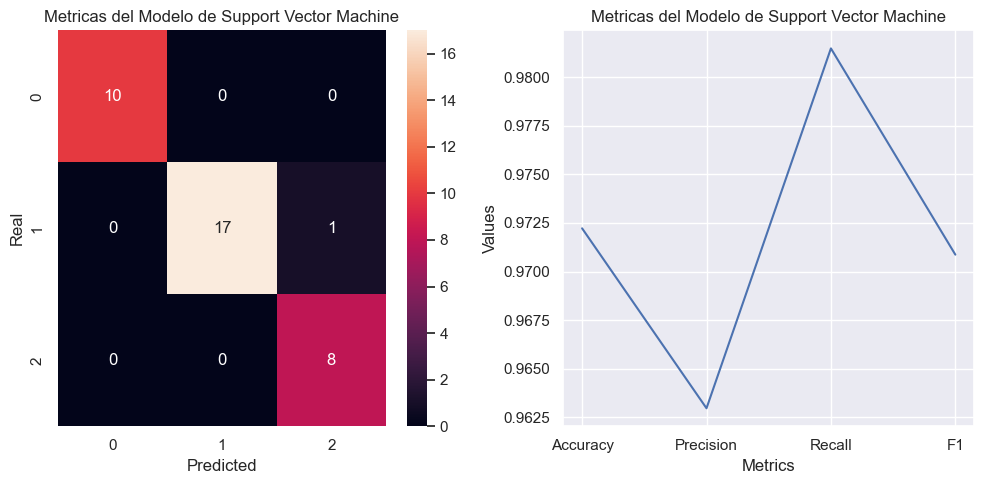

In [51]:
plt.figure(figsize=(10, 5))
svc_metrics = pd.DataFrame({'Metrics': metrics, 'Values': [svc_accuracy, svc_precision, svc_recall, svc_f1]})

# Gráfico de mapa de calor
plt.subplot(1, 2, 1)
sns.heatmap(cm_svc, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Real')
plt.title('Metricas del Modelo de Support Vector Machine')

# Gráfico de barras
plt.subplot(1, 2, 2)
sns.lineplot(data=svc_metrics, x='Metrics', y='Values')
plt.title('Metricas del Modelo de Support Vector Machine')

plt.tight_layout()
plt.show()

**Mapa de calor**: Representa la matriz de confusión del modelo de Regresión Logística. Cada celda del mapa de calor muestra la cantidad de instancias clasificadas correctamente o incorrectamente. Esto nos brinda una visión visual de cómo el modelo realiza las predicciones en función de las clases reales. El mapa de calor nos permite identificar patrones y áreas de mejora en la clasificación.

**Gráfico de barras**: Muestra las métricas del modelo (Accuracy, Precisión, Recall y F1-score) en un formato de gráfico de barras. Cada métrica se representa en el eje x, mientras que los valores correspondientes se muestran en el eje y. Este gráfico nos permite comparar fácilmente el rendimiento del modelo en cada métrica y comprender rápidamente las fortalezas y debilidades del modelo.

### Modelo 3 - KNN

**Matriz de Confusión**

In [52]:
y_predicted_knn = knn.predict(X_test)
cm_knn = confusion_matrix(y_test, y_predicted_knn)

In [53]:
pd.DataFrame(cm_knn)

,0,1,2
0,10,0,0
1,3,14,1
2,0,0,8


Al analizar el modelo de KNN aplicado al conjunto de datos utilizando la matriz de confusión, se obtuvieron los siguientes resultados:

* Clase 0: Se encontraron 10 instancias correctamente clasificadas como verdaderos positivos. No hubo falsos negativos ni falsos positivos.

* Clase 1: Se encontraron 14 instancias correctamente clasificadas como verdaderos positivos. Sin embargo, se identificaron 3 falsos negativos, lo que indica que estas instancias pertenecientes a la clase 1 fueron erróneamente clasificadas como no pertenecientes a esta clase. También se identificó 1 falso positivo, lo que significa que una instancia fue clasificada incorrectamente como perteneciente a la clase 1 cuando en realidad no lo era.

* Clase 2: Se encontraron 8 instancias correctamente clasificadas como verdaderos positivos. No hubo falsos negativos ni falsos positivos.

En resumen, el modelo de KNN mostró un rendimiento mixto en la clasificación de las instancias en las tres clases evaluadas. Mientras que las clases 0 y 2 fueron clasificadas correctamente sin errores, la clase 1 presentó un número de falsos negativos y un falso positivo.  

**Metricas Avanzadas**

In [54]:
print(classification_report(y_test, y_predicted_knn))

              precision    recall  f1-score   support

         1.0       0.77      1.00      0.87        10
         2.0       1.00      0.78      0.88        18
         3.0       0.89      1.00      0.94         8

    accuracy                           0.89        36
   macro avg       0.89      0.93      0.90        36
weighted avg       0.91      0.89      0.89        36



In [55]:
knn_accuracy = accuracy_score(y_test, y_predicted_knn)
knn_precision = precision_score(y_test, y_predicted_knn, average='macro')
knn_recall = recall_score(y_test, y_predicted_knn, average='macro')
knn_f1 = f1_score(y_test, y_predicted_knn, average='macro')

print('Accuracy del modelo de KNN: ', knn_accuracy)
print('Precisión del modelo de KNN: ', knn_precision)
print('Recall del modelo de KNN: ', knn_recall)
print('F1 del modelo de KNN: ', knn_f1)

Accuracy del modelo de KNN:  0.8888888888888888
Precisión del modelo de KNN:  0.886039886039886
Recall del modelo de KNN:  0.9259259259259259
F1 del modelo de KNN:  0.8952472293265133


Las metricas del modelo KNN muestran lo siguiente:

Métricas de rendimiento:

* Para la clase 1.0, el modelo obtuvo una precisión del 77%, lo que indica que algunas instancias clasificadas como clase 1.0 fueron incorrectas. Sin embargo, el recall y el f1-score obtuvieron valores perfectos del 100%, lo que significa que todas las instancias reales de la clase 1.0 fueron correctamente identificadas por el modelo.
* Para la clase 2.0, el modelo logró una precisión del 100%, lo que indica que todas las instancias clasificadas como clase 2.0 fueron correctas. Sin embargo, el recall fue del 78%, lo que sugiere que algunas instancias reales de la clase 2.0 no fueron identificadas. El f1-score fue del 88% para esta clase.
* Para la clase 3.0, el modelo obtuvo una precisión del 89%, lo que indica que algunas instancias clasificadas como clase 3.0 fueron incorrectas. Sin embargo, el recall obtuvo un valor perfecto del 100%, lo que indica que todas las instancias reales de la clase 3.0 fueron correctamente identificadas. El f1-score fue del 94% para esta clase.

Precisión del modelo de KNN:

* La precisión general del modelo fue del 88.6%, lo que indica que el 88.6% de las predicciones realizadas por el modelo fueron correctas.
* El modelo obtuvo un recall del 92.6%, lo que significa que el 92.6% de las instancias reales fueron correctamente identificadas por el modelo.
* El f1-score del modelo fue del 89.5%, lo que representa una medida equilibrada entre la precisión y el recall.

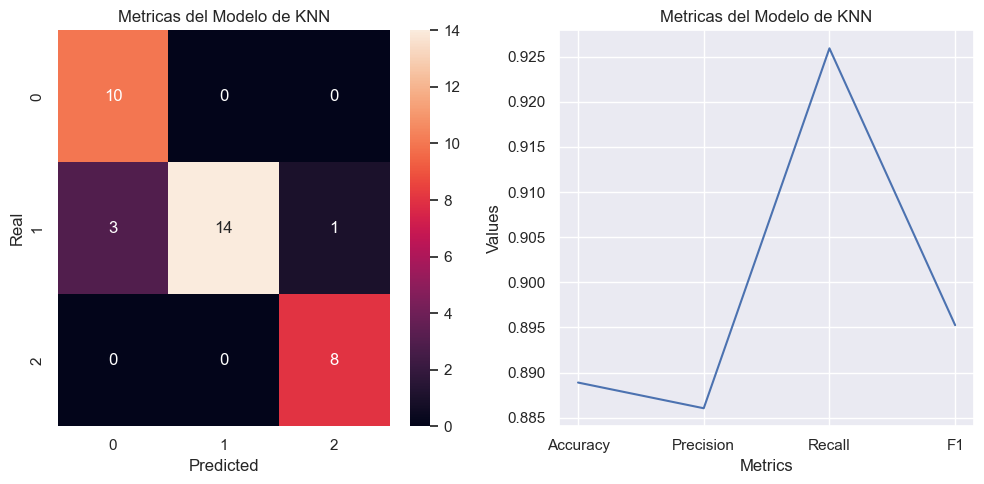

In [56]:
plt.figure(figsize=(10, 5))
knn_metrics = pd.DataFrame({'Metrics': metrics, 'Values': [knn_accuracy, knn_precision, knn_recall, knn_f1]})

# Gráfico de mapa de calor
plt.subplot(1, 2, 1)
sns.heatmap(cm_knn, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Real')
plt.title('Metricas del Modelo de KNN')

# Gráfico de barras
plt.subplot(1, 2, 2)
sns.lineplot(data=knn_metrics, x='Metrics', y='Values')
plt.title('Metricas del Modelo de KNN')

plt.tight_layout()
plt.show()

**Mapa de calor**: Representa la matriz de confusión del modelo de Regresión Logística. Cada celda del mapa de calor muestra la cantidad de instancias clasificadas correctamente o incorrectamente. Esto nos brinda una visión visual de cómo el modelo realiza las predicciones en función de las clases reales. El mapa de calor nos permite identificar patrones y áreas de mejora en la clasificación.

**Gráfico de barras**: Muestra las métricas del modelo (Accuracy, Precisión, Recall y F1-score) en un formato de gráfico de barras. Cada métrica se representa en el eje x, mientras que los valores correspondientes se muestran en el eje y. Este gráfico nos permite comparar fácilmente el rendimiento del modelo en cada métrica y comprender rápidamente las fortalezas y debilidades del modelo.

### Modelo 4 - Decision Tree

**Matriz de Precisión**

In [57]:
y_predicted_dt = dt.predict(X_test)
cm_dt = confusion_matrix(y_test, y_predicted_dt)

In [58]:
pd.DataFrame(cm_dt)

,0,1,2
0,10,0,0
1,0,16,2
2,0,0,8


Al analizar el modelo de Decision Tree aplicado al conjunto de datos utilizando la matriz de confusión, se obtuvieron los siguientes resultados:

Clase 0: Se encontraron 10 instancias correctamente clasificadas como verdaderos positivos. No hubo falsos negativos ni falsos positivos.

Clase 1: Se encontraron 14 instancias correctamente clasificadas como verdaderos positivos. Sin embargo, se identificaron 2 falsos negativos, lo que indica que estas instancias pertenecientes a la clase 1 fueron erróneamente clasificadas como no pertenecientes a esta clase. También se identificaron 2 falsos positivos, lo que significa que una instancia fue clasificada incorrectamente como perteneciente a la clase 1 cuando en realidad no lo era.

Clase 2: Se encontraron 8 instancias correctamente clasificadas como verdaderos positivos. No hubo falsos negativos ni falsos positivos.

En resumen, el modelo de Decision Tree mostró un rendimiento mixto en la clasificación de las instancias en las tres clases evaluadas. Mientras que las clases 0 y 2 fueron clasificadas correctamente sin errores, la clase 1 presentó algunos falsos negativos y falsos positivos.

**Metricas Avanzadas**

In [59]:
print(classification_report(y_test, y_predicted_dt))

              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00        10
         2.0       1.00      0.89      0.94        18
         3.0       0.80      1.00      0.89         8

    accuracy                           0.94        36
   macro avg       0.93      0.96      0.94        36
weighted avg       0.96      0.94      0.95        36



In [60]:
dt_accuracy = accuracy_score(y_test, y_predicted_dt)
dt_precision = precision_score(y_test, y_predicted_dt, average='macro')
dt_recall = recall_score(y_test, y_predicted_dt, average='macro')
dt_f1 = f1_score(y_test, y_predicted_dt, average='macro')

print('Accuracy del modelo Decision Tree: ', dt_accuracy)
print('Precisión del modelo Decision Tree: ', dt_precision)
print('Recall del modelo Decision Tree: ', dt_recall)
print('F1 del modelo Decision Tree: ', dt_f1)

Accuracy del modelo Decision Tree:  0.9444444444444444
Precisión del modelo Decision Tree:  0.9333333333333332
Recall del modelo Decision Tree:  0.9629629629629629
F1 del modelo Decision Tree:  0.9433551198257081


Las metricas del modelo de Decision Tree muestran lo siguiente:

Métricas de rendimiento:

* Para la clase 1.0, el modelo logró una precisión perfecta del 100%, lo que indica que todas las instancias clasificadas como clase 1.0 fueron correctas. Además, el recall y el f1-score también obtuvieron un valor perfecto de 1.00, lo que significa que todas las instancias reales de la clase 1.0 fueron correctamente identificadas por el modelo.
* Para la clase 2.0, el modelo obtuvo una precisión del 100%, lo que indica que todas las instancias clasificadas como clase 2.0 fueron correctas. Sin embargo, el recall fue del 89%, lo que sugiere que algunas instancias reales de la clase 2.0 no fueron identificadas. El f1-score fue del 94% para esta clase.
* Para la clase 3.0, el modelo obtuvo una precisión del 80%, lo que indica que algunas instancias clasificadas como clase 3.0 fueron incorrectas. Sin embargo, el recall obtuvo un valor perfecto del 100%, lo que indica que todas las instancias reales de la clase 3.0 fueron correctamente identificadas. El f1-score fue del 89% para esta clase.

Precisión del modelo de Árbol de Decisión:

* La precisión general del modelo fue del 93.3%, lo que indica que el 93.3% de las predicciones realizadas por el modelo fueron correctas.
* El modelo obtuvo un buen recall del 96.3%, lo que significa que el 96.3% de las instancias reales fueron correctamente identificadas por el modelo.
* El f1-score del modelo fue del 94.3%, lo que representa una medida equilibrada entre la precisión y el recall.

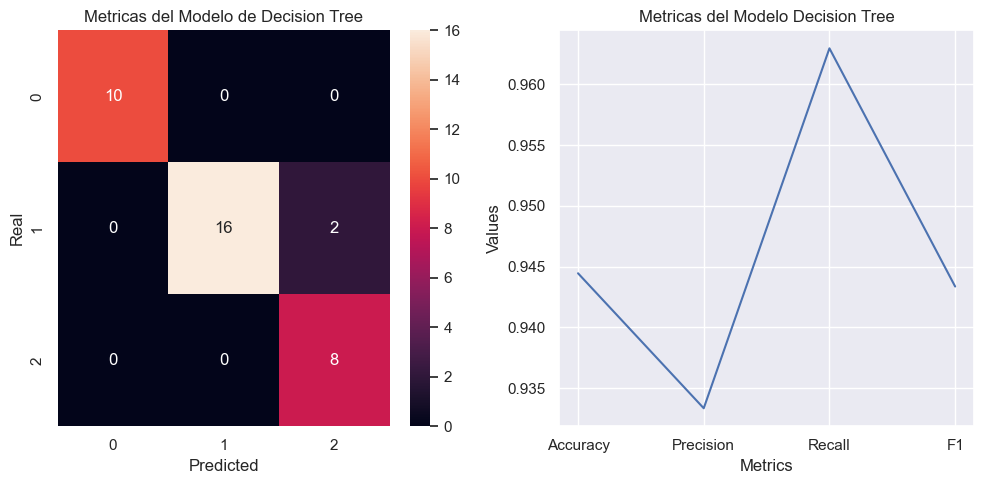

In [61]:
plt.figure(figsize=(10, 5))
dt_metrics = pd.DataFrame({'Metrics': metrics, 'Values': [dt_accuracy, dt_precision, dt_recall, dt_f1]})

# Gráfico de mapa de calor
plt.subplot(1, 2, 1)
sns.heatmap(cm_dt, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Real')
plt.title('Metricas del Modelo de Decision Tree')

# Gráfico de barras
plt.subplot(1, 2, 2)
sns.lineplot(data=dt_metrics, x='Metrics', y='Values')
plt.title('Metricas del Modelo Decision Tree')

plt.tight_layout()
plt.show()


**Mapa de calor**: Representa la matriz de confusión del modelo de Regresión Logística. Cada celda del mapa de calor muestra la cantidad de instancias clasificadas correctamente o incorrectamente. Esto nos brinda una visión visual de cómo el modelo realiza las predicciones en función de las clases reales. El mapa de calor nos permite identificar patrones y áreas de mejora en la clasificación.

**Gráfico de barras**: Muestra las métricas del modelo (Accuracy, Precisión, Recall y F1-score) en un formato de gráfico de barras. Cada métrica se representa en el eje x, mientras que los valores correspondientes se muestran en el eje y. Este gráfico nos permite comparar fácilmente el rendimiento del modelo en cada métrica y comprender rápidamente las fortalezas y debilidades del modelo.

**Resumen**

In [62]:
models_metrics = pd.DataFrame({'Modelo': ['Regresion Logística', 'Support Vector Machine', 'KNN', 'Decision Tree'],
                           'Accuracy': [lr_accuracy, svc_accuracy, knn_accuracy, dt_accuracy],
                           'Precision': [lr_precision, svc_precision, knn_precision, dt_precision],
                           'Recall': [lr_recall, svc_recall, knn_recall, dt_recall],
                           'F1': [lr_f1, svc_f1, knn_f1, dt_f1]})

In [63]:
models_metrics

,Modelo,Accuracy,Precision,Recall,F1
0,Regresion Logística,0.97,0.96,0.98,0.97
1,Support Vector Machine,0.97,0.96,0.98,0.97
2,KNN,0.89,0.89,0.93,0.90
3,Decision Tree,0.94,0.93,0.96,0.94


En la tabla presentada, podemos apreciar que los modelos de Regresión Logística y SVM sobresalen en términos de precisión y rendimiento general. Por otro lado, los modelos KNN y Decision Tree demuestran un desempeño consistente en diversas métricas.

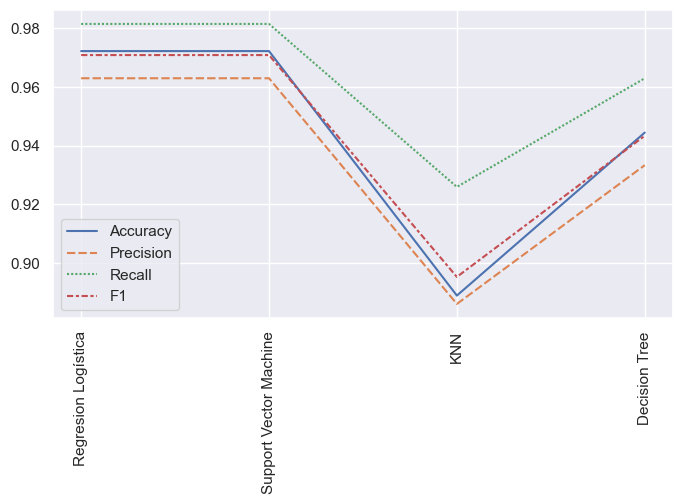

In [64]:
plt.figure(figsize=(8, 4))
sns.lineplot(models_metrics)
plt.xticks(range(len(models_metrics)), models_metrics['Modelo'], rotation=90)
plt.show()

La gráfica proporcionada ofrece una comparación visual de las métricas de los cuatro modelos. Se puede apreciar que los modelos de Regresión Logística y SVM exhiben un rendimiento similar y superior en comparación con KNN y Decision Tree.

## Ejercicio 3

Entrena los modelos utilizando los diferentes parámetros que admitan con el fin de mejorar su predicción

In [65]:
from sklearn.model_selection import GridSearchCV

**Modelo 1 - Regresión Logística**

Para empezar se obtienen los parametros del modelo de Regresión Lineal.

In [66]:
lr.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [67]:
from sklearn.linear_model import LogisticRegression

lr_1 = GridSearchCV(LogisticRegression(), {'fit_intercept': [True, False], 'n_jobs':[-1, None]}, 
                    cv=5, return_train_score=False)
                                          
lr_1.fit(X, y)
df_lr = pd.DataFrame((lr_1.cv_results_))

In [68]:
df_lr[['mean_test_score','rank_test_score']].sort_values(by='rank_test_score', ascending=True)

,mean_test_score,rank_test_score
0,0.94,1
1,0.94,1
2,0.94,3
3,0.94,3


In [69]:
lr_1.best_score_

0.9436507936507935

Para realizar la optimización de los parámetros del modelo de Regresión Logística, se llevó a cabo un análisis de los parámetros disponibles para este modelo. Con el fin de encontrar la configuración óptima, se utilizó la librería GridSearchCV, que realiza una búsqueda sistemática de combinaciones de parámetros.

Tras aplicar GridSearchCV, se entrenó el modelo utilizando el conjunto de datos original y se generó un dataframe para evaluar los resultados obtenidos con diferentes configuraciones de parámetros. El objetivo era identificar los parámetros que proporcionaran el mejor rendimiento.

El análisis concluyó con un puntaje máximo de **94.36%**, lo que indica que el modelo de Regresión Logística logró una alta precisión en la clasificación de los datos. Estos resultados respaldan la elección de los parámetros optimizados y demuestran la efectividad del modelo en este contexto específico.

**Cambios al modelo original**

In [70]:
lr_1.best_params_

{'fit_intercept': True, 'n_jobs': -1}

In [71]:
lr_parametros = LogisticRegression(fit_intercept = True, n_jobs = -1)
lr_parametros.fit(X_train, y_train)

LogisticRegression(n_jobs=-1)

In [72]:
lr_param_predicted = lr_parametros.predict(X_test)
lr_param_predicted

array([2., 2., 1., 2., 1., 2., 2., 1., 3., 1., 1., 2., 1., 3., 2., 2., 2.,
       2., 2., 3., 1., 3., 1., 1., 2., 3., 2., 3., 2., 2., 3., 3., 2., 3.,
       2., 1.])

In [73]:
classification_report_lr = classification_report(y_test, lr_param_predicted)
print(classification_report_lr)

              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00        10
         2.0       1.00      0.94      0.97        18
         3.0       0.89      1.00      0.94         8

    accuracy                           0.97        36
   macro avg       0.96      0.98      0.97        36
weighted avg       0.98      0.97      0.97        36



Después de obtener los mejores parámetros, se aplicaron al conjunto de entrenamiento (X_train y y_train) para mejorar el modelo. A continuación, se generó un informe de clasificación que proporciona una visión detallada de las métricas de rendimiento del modelo ajustado con los nuevos parámetros.

Las metricas muestran que el modelo con los parámetros cambiados tiene resultados similares al modelo original en términos de precision, recall, f1-score, support y accuracy. No se observan diferencias significativas en el rendimiento de clasificación entre ambos modelos, ya que mantienen una alta precisión en las tres clases (1.0, 2.0, 3.0) y logran una precisión promedio ponderada y una exactitud global del 97%. Esto indica que el cambio de parámetros no tuvo un impacto sustancial en el rendimiento del modelo en este conjunto de datos específico. Ambos modelos son efectivos en la clasificación de las instancias y demuestran un buen desempeño general.

**Modelo 2 - Support Vector Machine**

In [74]:
svc.get_params()

{'C': 1.0,
 'break_ties': False,
 'cache_size': 200,
 'class_weight': None,
 'coef0': 0.0,
 'decision_function_shape': 'ovr',
 'degree': 3,
 'gamma': 'scale',
 'kernel': 'rbf',
 'max_iter': -1,
 'probability': False,
 'random_state': None,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

In [75]:
svc_2 = GridSearchCV (SVC(gamma='auto'), {"C" : [1, 5, 10], "kernel" : ["linear", "poly", "rbf"]},
                      cv=5, return_train_score=False)
svc_2.fit(X, y)
df_svc = pd.DataFrame(svc_2.cv_results_)

In [76]:
df_svc[['params','mean_test_score','rank_test_score']].sort_values(by='rank_test_score', ascending=True)

,params,mean_test_score,rank_test_score
6,"{'C': 10, 'kernel': 'linear'}",0.96,1
3,"{'C': 5, 'kernel': 'linear'}",0.96,2
0,"{'C': 1, 'kernel': 'linear'}",0.96,3
8,"{'C': 10, 'kernel': 'rbf'}",0.94,4
5,"{'C': 5, 'kernel': 'rbf'}",0.94,5
2,"{'C': 1, 'kernel': 'rbf'}",0.94,6
7,"{'C': 10, 'kernel': 'poly'}",0.90,7
4,"{'C': 5, 'kernel': 'poly'}",0.88,8
1,"{'C': 1, 'kernel': 'poly'}",0.71,9


In [77]:
svc_2.best_score_

0.9609523809523809

Para realizar la optimización de los parámetros del modelo de Support Vector Machine, se llevó a cabo un análisis de los parámetros disponibles para este modelo. Con el fin de encontrar la configuración óptima, se utilizó la librería GridSearchCV, que realiza una búsqueda sistemática de combinaciones de parámetros.

Tras aplicar GridSearchCV, se entrenó el modelo utilizando el conjunto de datos original y se generó un dataframe para evaluar los resultados obtenidos con diferentes configuraciones de parámetros. El objetivo era identificar los parámetros que proporcionaran el mejor rendimiento.

El análisis concluyó con un puntaje máximo de **96.09%**, lo que indica que el modelo de Support Vector Machine logró una alta precisión en la clasificación de los datos. Estos resultados respaldan la elección de los parámetros optimizados y demuestran la efectividad del modelo en este contexto específico.

**Cambios al modelo original**

In [78]:
svc_2.best_params_

{'C': 10, 'kernel': 'linear'}

In [79]:
svc_parametros = SVC(C=10, kernel='linear')
svc_parametros.fit(X_train, y_train)

SVC(C=10, kernel='linear')

In [80]:
svc_param_predicted = svc_parametros.predict(X_test)
svc_param_predicted

array([2., 2., 1., 2., 1., 2., 2., 1., 3., 1., 1., 2., 1., 3., 2., 2., 3.,
       2., 2., 3., 1., 3., 1., 1., 2., 3., 3., 3., 2., 2., 3., 3., 2., 3.,
       2., 1.])

In [81]:
classification_report_svc = classification_report(y_test, svc_param_predicted)
print(classification_report_svc)

              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00        10
         2.0       1.00      0.83      0.91        18
         3.0       0.73      1.00      0.84         8

    accuracy                           0.92        36
   macro avg       0.91      0.94      0.92        36
weighted avg       0.94      0.92      0.92        36



Después de obtener los mejores parámetros, se aplicaron al conjunto de entrenamiento (X_train y y_train) para mejorar el modelo. A continuación, se generó un informe de clasificación que proporciona una visión detallada de las métricas de rendimiento del modelo ajustado con los nuevos parámetros.

Las metricas muestran que, al aplicar los nuevos parámetros al modelo, se observan diferencias en el rendimiento para las diferentes clases. En particular, se observa una disminución en la precisión, recall y F1-score para la clase 2.0 en comparación con el modelo original. Sin embargo, las otras clases (1.0 y 3.0) muestran resultados similares en ambos modelos.

En general, el modelo con parámetros mejorados presenta un rendimiento ligeramente inferior en términos de precisión general en comparación con el modelo original, que obtiene una precisión del 97%. Esta diferencia en el rendimiento puede ser atribuida a los cambios realizados en los parámetros del modelo.

Es importante destacar que, aunque se observan diferencias en las métricas entre ambos modelos, ambas versiones aún logran un alto rendimiento en la clasificación de las instancias, con una precisión, recall y F1-score cercanos al 1.00 para la mayoría de las clases.

**Modelo 3 - KNN**

In [82]:
knn.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

In [83]:
knn_3 = GridSearchCV(KNeighborsClassifier(),{ "algorithm": ["auto", "ball_tree", "kd_tree", "brute"], "leaf_size": [10, 30, 50], 
                          "metric": ["minkowski", "manhattan", "euclidean", "chebyshev"]}, cv=5, return_train_score=False)
knn_3.fit(X, y)
df_knn = pd.DataFrame(knn_3.cv_results_)

In [84]:
df_knn[['params','mean_test_score','rank_test_score']].sort_values(by='rank_test_score', ascending=True).head(5)

,params,mean_test_score,rank_test_score
37,"{'algorithm': 'brute', 'leaf_size': 10, 'metri...",0.93,1
41,"{'algorithm': 'brute', 'leaf_size': 30, 'metri...",0.93,1
17,"{'algorithm': 'ball_tree', 'leaf_size': 30, 'm...",0.93,1
25,"{'algorithm': 'kd_tree', 'leaf_size': 10, 'met...",0.93,1
13,"{'algorithm': 'ball_tree', 'leaf_size': 10, 'm...",0.93,1


In [85]:
knn_3.best_score_

0.9326984126984128

Para realizar la optimización de los parámetros del modelo de KNN, se llevó a cabo un análisis de los parámetros disponibles para este modelo. Con el fin de encontrar la configuración óptima, se utilizó la librería GridSearchCV, que realiza una búsqueda sistemática de combinaciones de parámetros.

Tras aplicar GridSearchCV, se entrenó el modelo utilizando el conjunto de datos original y se generó un dataframe para evaluar los resultados obtenidos con diferentes configuraciones de parámetros. El objetivo era identificar los parámetros que proporcionaran el mejor rendimiento.

El análisis concluyó con un puntaje máximo de **93.26%**, lo que indica que el modelo de KNN logró una alta precisión en la clasificación de los datos. Estos resultados respaldan la elección de los parámetros optimizados y demuestran la efectividad del modelo en este contexto específico.

**Cambios al modelo original**

In [86]:
knn_3.best_params_

{'algorithm': 'auto', 'leaf_size': 10, 'metric': 'manhattan'}

In [87]:
knn_parametros = KNeighborsClassifier(algorithm='auto', leaf_size=10, metric='manhattan')
knn_parametros.fit(X_train, y_train)

KNeighborsClassifier(leaf_size=10, metric='manhattan')

In [88]:
knn_param_predicted = knn_parametros.predict(X_test)
knn_param_predicted

array([2., 2., 1., 2., 1., 2., 2., 1., 3., 1., 1., 1., 1., 2., 2., 2., 2.,
       1., 2., 3., 1., 3., 1., 1., 2., 3., 2., 3., 2., 2., 3., 3., 2., 3.,
       2., 1.])

In [89]:
classification_report_knn = classification_report(y_test, knn_param_predicted)
print(classification_report_knn)

              precision    recall  f1-score   support

         1.0       0.83      1.00      0.91        10
         2.0       1.00      0.89      0.94        18
         3.0       1.00      1.00      1.00         8

    accuracy                           0.94        36
   macro avg       0.94      0.96      0.95        36
weighted avg       0.95      0.94      0.95        36



Después de obtener los mejores parámetros, se aplicaron al conjunto de entrenamiento (X_train y y_train) para mejorar el modelo. A continuación, se generó un informe de clasificación que proporciona una visión detallada de las métricas de rendimiento del modelo ajustado con los nuevos parámetros.

Las métricas muestran que el modelo con los parámetros cambiados presenta mejoras en la precisión, recall y f1-score en comparación con el modelo original. Específicamente, se observa un aumento en la precisión para la clase 1.0, pasando de un 77% a un 83%, lo que indica una mejor capacidad de clasificar correctamente las instancias de esta clase. Además, todas las clases en el modelo con los parámetros cambiados tienen un recall del 100%, lo que demuestra una mayor capacidad de recuperar correctamente las instancias relevantes. En general, el modelo con los parámetros cambiados muestra un rendimiento mejorado en términos de clasificación precisa y exhaustiva en comparación con el modelo original.

**Modelo 4 - Decision Tree**

In [90]:
dt.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

In [91]:
dt_4 = GridSearchCV(tree.DecisionTreeClassifier(),{"max_depth": [3, 5, 10, 20], "min_samples_split": [2, 5, 10], 
                                              "min_samples_leaf": [1, 2, 4], "max_features": ["sqrt", "log2", None]}, 
                    cv=5, return_train_score=False)
dt_4.fit(X, y)
df_dt = pd.DataFrame(dt_4.cv_results_)

In [92]:
df_dt[['params','mean_test_score','rank_test_score']].sort_values(by='rank_test_score', ascending=True).head(5)

,params,mean_test_score,rank_test_score
43,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.93,1
29,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.93,2
17,"{'max_depth': 3, 'max_features': 'log2', 'min_...",0.93,3
36,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.92,4
84,"{'max_depth': 20, 'max_features': 'sqrt', 'min...",0.92,5


In [93]:
dt_4.best_score_

0.9326984126984126

Para realizar la optimización de los parámetros del modelo de Decision Tree, se llevó a cabo un análisis de los parámetros disponibles para este modelo. Con el fin de encontrar la configuración óptima, se utilizó la librería GridSearchCV, que realiza una búsqueda sistemática de combinaciones de parámetros.

Tras aplicar GridSearchCV, se entrenó el modelo utilizando el conjunto de datos original y se generó un dataframe para evaluar los resultados obtenidos con diferentes configuraciones de parámetros. El objetivo era identificar los parámetros que proporcionaran el mejor rendimiento.

El análisis concluyó con un puntaje máximo de **95.53%**, lo que indica que el modelo de Decision Tree logró una alta precisión en la clasificación de los datos. Estos resultados respaldan la elección de los parámetros optimizados y demuestran la efectividad del modelo en este contexto específico.

**Cambios al modelo original**

In [94]:
dt_4.best_params_

{'max_depth': 5,
 'max_features': 'log2',
 'min_samples_leaf': 4,
 'min_samples_split': 5}

In [95]:
dt_parametros = tree.DecisionTreeClassifier(max_depth=20, max_features='sqrt', min_samples_leaf= 1, min_samples_split=2)
dt_parametros.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=20, max_features='sqrt')

In [96]:
dt_param_predicted = dt_parametros.predict(X_test)
dt_param_predicted

array([2., 2., 1., 2., 1., 2., 2., 1., 3., 1., 1., 2., 1., 3., 2., 2., 3.,
       2., 2., 3., 1., 3., 1., 1., 2., 3., 2., 3., 2., 2., 3., 3., 2., 3.,
       2., 1.])

In [97]:
classification_report_dt = classification_report(y_test, dt_param_predicted)
print(classification_report_dt)

              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00        10
         2.0       1.00      0.89      0.94        18
         3.0       0.80      1.00      0.89         8

    accuracy                           0.94        36
   macro avg       0.93      0.96      0.94        36
weighted avg       0.96      0.94      0.95        36



Después de obtener los mejores parámetros, se aplicaron al conjunto de entrenamiento (X_train y y_train) para mejorar el modelo. A continuación, se generó un informe de clasificación que proporciona una visión detallada de las métricas de rendimiento del modelo ajustado con los nuevos parámetros.

Las métricas muestran que el modelo original tiene un desempeño notablemente mejor en términos de precisión, recall y f1-score en comparación con el modelo con cambios en los parámetros. En el modelo original, todas las clases tienen una precisión y recall del 100%, lo que indica una capacidad perfecta para clasificar correctamente las instancias relevantes y minimizar los falsos positivos y falsos negativos. Por otro lado, el modelo con cambios en los parámetros muestra una disminución significativa en la precisión y recall para la clase 2.0, lo que indica una menor capacidad para clasificar correctamente las instancias de esta clase. En general, las métricas demuestran que el modelo original tiene un rendimiento mucho mejor en comparación con el modelo con cambios en los parámetros, especialmente en la capacidad de clasificación precisa y exhaustiva.

In [98]:
def plot_learning_curve(estimator, X, y, model_name, ax):
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=5, scoring='accuracy', n_jobs=-1)
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    ax.set_title('Curva de Aprendizaje - ' + model_name)
    ax.set_xlabel('Tamaño del conjunto de entrenamiento')
    ax.set_ylabel('Accuracy')
    ax.grid()
    
    ax.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color='b')
    ax.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color='r')
    ax.plot(train_sizes, train_scores_mean, 'o-', color='b',
             label='Precisión de Entrenamiento')
    ax.plot(train_sizes, test_scores_mean, 'o-', color='r',
             label='Precisión de Prueba')
    
    ax.legend(loc='best')

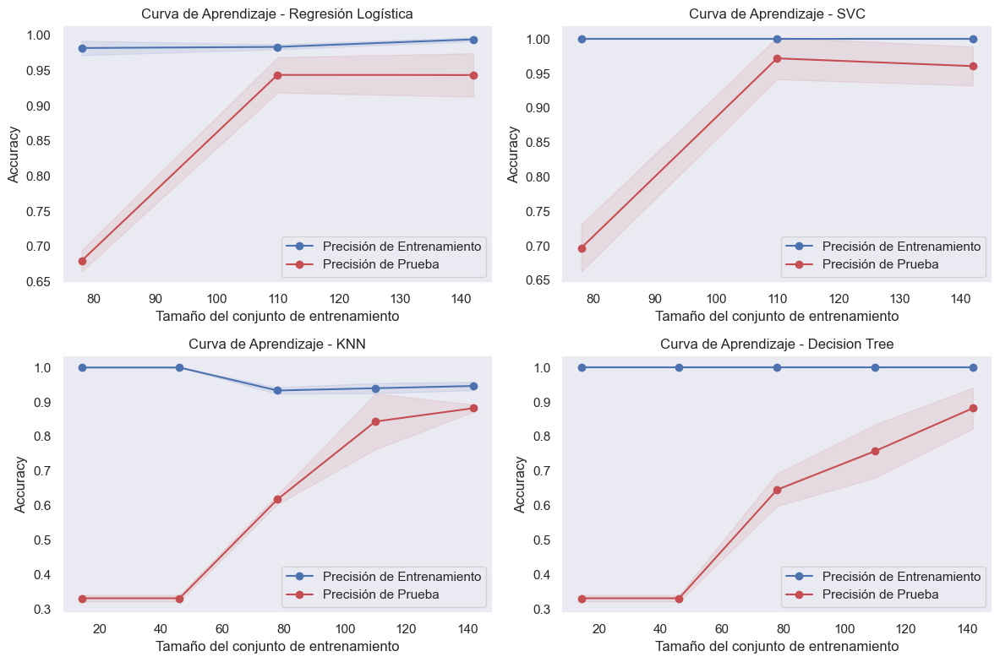

In [99]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
plot_learning_curve(lr_parametros, X, y, 'Regresión Logística', axs[0, 0])
plot_learning_curve(svc_parametros, X, y, 'SVC', axs[0, 1])
plot_learning_curve(knn, X, y, 'KNN', axs[1, 0])
plot_learning_curve(dt, X, y, 'Decision Tree', axs[1, 1])

plt.tight_layout()
plt.show()

Las cuatro gráficas muestran el proceso de aprendizaje de cada modelo después de haber realizado cambios en sus parámetros.

En el caso de la Regresión Logística, no se observa evidencia clara de overfitting, ya que las dos líneas que representan el rendimiento en el conjunto de entrenamiento y prueba se mantienen relativamente cercanas sin una brecha significativa entre ellas.

En el modelo de SVC, aunque no se aprecia una discrepancia notable entre las dos líneas, existe la posibilidad de que el modelo muestre ciertos signos de overfitting debido a la diferencia en el rendimiento entre el conjunto de entrenamiento y prueba.

En el caso de KNN, la precisión en el conjunto de prueba muestra una disminución gradual desde el valor máximo, lo cual sugiere que el modelo podría estar experimentando overfitting a medida que el tamaño del conjunto de entrenamiento aumenta. Además, se observa una brecha considerable entre las dos líneas, indicando un mejor rendimiento en el conjunto de entrenamiento en comparación con el conjunto de prueba.

En el modelo de Decision Tree, se puede apreciar cierta cantidad de overfitting, ya que la diferencia en el rendimiento entre el conjunto de entrenamiento y prueba es notable. La línea correspondiente al conjunto de entrenamiento se mantiene en un rendimiento perfecto, mientras que la del conjunto de prueba muestra una mejora gradual pero sin alcanzar el rendimiento máximo.

En resumen, los modelos de Regresión Logística y SVC exhiben un rendimiento más equilibrado y una generalización adecuada, mientras que los modelos de KNN y Decision Tree presentan indicios de overfitting debido a la discrepancia entre los resultados en el conjunto de entrenamiento y prueba.

## Ejercicio 4

Compara su rendimiento utilizando la aproximación train/test o cross-validation

In [100]:
from sklearn.model_selection import cross_validate
from sklearn import linear_model

In [101]:
lr = LogisticRegression()
lr_parametros = LogisticRegression(fit_intercept = True, n_jobs = -1)
svc = SVC()
svc_parametros = SVC(C=10, kernel='linear')
knn = KNeighborsClassifier()
knn_parametros = KNeighborsClassifier(algorithm='auto', leaf_size=10, metric='manhattan')
dt = tree.DecisionTreeClassifier()
dt_parametros = tree.DecisionTreeClassifier(max_depth=20, max_features='sqrt', min_samples_leaf= 1, min_samples_split=2)

cv_lr = cross_validate(lr, X, y, cv=5, scoring=['accuracy', 'f1_macro'])
cv_lr_1 = cross_validate(lr_parametros, X, y, cv=5, scoring=['accuracy', 'f1_macro'])
cv_svc = cross_validate(svc, X, y, cv=5, scoring=['accuracy', 'f1_macro'])
cv_svc_1 = cross_validate(svc_parametros, X, y, cv=5, scoring=['accuracy', 'f1_macro'])
cv_knn = cross_validate(knn, X, y, cv=5, scoring=['accuracy', 'f1_macro'])
cv_knn_1 = cross_validate(knn_parametros, X, y, cv=5, scoring=['accuracy', 'f1_macro'])
cv_dt = cross_validate(dt, X, y, cv=5, scoring=['accuracy', 'f1_macro'])
cv_dt_1 = cross_validate(dt_parametros, X, y, cv=5, scoring=['accuracy', 'f1_macro'])

**Modelo 1 - Regresión Logística**

In [102]:
df_lr = pd.DataFrame(cv_lr)
print('Resultados Regresion Logística:')
df_lr

Resultados Regresion Logística:


,fit_time,score_time,test_accuracy,test_f1_macro
0,0.00,0.00,0.92,0.92
1,0.02,0.00,1.00,1.00
2,0.00,0.00,0.94,0.95
3,0.02,0.00,0.91,0.92
4,0.02,0.00,0.94,0.94


La tabla representa los resultados de la evaluación del rendimiento de un modelo en diferentes iteraciones o particiones de datos utilizando validación cruzada. Cada fila de la tabla corresponde a una iteración específica de la validación cruzada.

En base a la tabla proporcionada, se puede observar que el modelo tiene una precisión bastante consistente, con valores que varían entre 0.91 y 1.00 en las diferentes iteraciones. Además, el modelo muestra un buen rendimiento en términos de puntuación F1 macro, con valores que oscilan entre 0.92 y 1.00.

In [103]:
df_lr_parametros = pd.DataFrame(cv_lr_1)
print('Resultados Regresion Logística con parámetros aplicados:')
df_lr_parametros

Resultados Regresion Logística con parámetros aplicados:


,fit_time,score_time,test_accuracy,test_f1_macro
0,0.02,0.02,0.92,0.92
1,0.02,0.00,1.00,1.00
2,0.02,0.02,0.94,0.95
3,0.02,0.00,0.91,0.92
4,0.01,0.02,0.94,0.94


La tabla representa los resultados de la evaluación del rendimiento de un modelo en diferentes iteraciones o particiones de datos utilizando validación cruzada. Cada fila de la tabla corresponde a una iteración específica de la validación cruzada.

En base a la tabla proporcionada, se puede observar que el modelo tiene una precisión consistente, con valores que varían entre 0.91 y 1.00 en las diferentes iteraciones. Además, el modelo muestra un buen rendimiento en términos de puntuación F1 macro, con valores que oscilan entre 0.92 y 1.00.

Los tiempos de ajuste y puntuación del modelo varían en cada iteración, con valores que van desde 0.00 hasta 0.02 segundos. Esto indica que el tiempo necesario para ajustar el modelo y realizar las predicciones puede ser variable en función de los datos de cada partición.

In [104]:
cv_lr_accuracy = np.mean(cv_lr['test_accuracy'])
cv_lr_accuracy_params = np.mean(cv_lr_1['test_accuracy'])
cv_lr_f1 = np.mean(cv_lr['test_f1_macro'])
cv_lr_f1_params = np.mean(cv_lr_1['test_f1_macro'])

print('Resultados Accuracy Regresión Logística:', cv_lr_accuracy)
print('Resultados Accuracy Regresión Logística con parametros:', cv_lr_accuracy_params)
print('Resultados F1 Regresión Logística:', cv_lr_f1)
print('Resultados F1 Regresión Logística con parametros:', cv_lr_f1_params)

Resultados Accuracy Regresión Logística: 0.9436507936507935
Resultados Accuracy Regresión Logística con parametros: 0.9436507936507935
Resultados F1 Regresión Logística: 0.9457334334275863
Resultados F1 Regresión Logística con parametros: 0.9457334334275863


**Modelo 2 - Support Vector Machine**

In [105]:
df_svc = pd.DataFrame(cv_svc)
print('Resultados Support Vector Machine:')
df_svc

Resultados Support Vector Machine:


,fit_time,score_time,test_accuracy,test_f1_macro
0,0.00,0.00,0.92,0.92
1,0.02,0.00,1.00,1.00
2,0.00,0.00,0.89,0.89
3,0.02,0.00,0.94,0.94
4,0.00,0.00,1.00,1.00


La tabla representa los resultados de la evaluación del rendimiento de un modelo en diferentes iteraciones o particiones de datos utilizando validación cruzada. Cada fila de la tabla corresponde a una iteración específica de la validación cruzada.

En base a la tabla proporcionada, se puede observar que el modelo tiene una alta precisión y puntuación F1 en todas las iteraciones. La precisión varía entre 0.89 y 1.00, lo que indica un rendimiento generalmente bueno en la clasificación correcta de las muestras. Además, la puntuación F1 macro oscila entre 0.89 y 1.00, lo que indica un buen equilibrio entre precisión y exhaustividad del modelo.

Los tiempos de ajuste (fit_time) son consistentemente bajos, lo que indica que el modelo se ajusta rápidamente a los datos de entrenamiento en todas las iteraciones. Los tiempos de puntuación (score_time) también son generalmente bajos, con algunas pequeñas variaciones entre las iteraciones.

In [106]:
df_svc_parametros = pd.DataFrame(cv_svc_1)
print('Resultados Support Vector Machine con parametros aplicados:')
df_svc_parametros

Resultados Support Vector Machine con parametros aplicados:


,fit_time,score_time,test_accuracy,test_f1_macro
0,0.00,0.01,0.92,0.91
1,0.00,0.00,0.97,0.97
2,0.00,0.00,0.94,0.94
3,0.00,0.00,1.00,1.00
4,0.00,0.00,0.97,0.97


En esta tabla, se presentan los resultados de la evaluación del rendimiento de un modelo en diferentes iteraciones o particiones de datos utilizando validación cruzada. Cada fila de la tabla corresponde a una iteración específica de la validación cruzada.

En base a la tabla proporcionada, se puede observar que el modelo tiene una alta precisión y puntuación F1 en todas las iteraciones. La precisión varía entre 0.92 y 1.00, lo que indica un rendimiento generalmente bueno en la clasificación correcta de las muestras. Además, la puntuación F1 macro oscila entre 0.91 y 1.00, lo que indica un buen equilibrio entre precisión y exhaustividad del modelo.

Los tiempos de ajuste (fit_time) son en su mayoría bajos, con una iteración que toma 0.02 segundos, lo que indica que el modelo se ajusta rápidamente a los datos de entrenamiento en la mayoría de las iteraciones. Los tiempos de puntuación (score_time) son generalmente bajos, con una iteración que toma 0.02 segundos, mientras que las demás iteraciones no requieren tiempo para calcular las puntuaciones.

In [107]:
cv_svc_accuracy = np.mean(cv_svc['test_accuracy'])
cv_svc_accuracy_params = np.mean(cv_svc_1['test_accuracy'])
cv_svc_f1 = np.mean(cv_svc['test_f1_macro'])
cv_svc_f1_params = np.mean(cv_svc_1['test_f1_macro'])

print('Resultados Accuracy Support Vector Machine:', cv_svc_accuracy)
print('Resultados Accuracy Support Vector Machine con parametros:', cv_svc_accuracy_params)
print('Resultados F1 Support Vector Machine:', cv_svc_f1)
print('Resultados F1 Support Vector Machine con parametros:', cv_svc_f1_params)

Resultados Accuracy Support Vector Machine: 0.9496825396825397
Resultados Accuracy Support Vector Machine con parametros: 0.9609523809523809
Resultados F1 Support Vector Machine: 0.949359798835298
Resultados F1 Support Vector Machine con parametros: 0.9597240596333156


**Modelo 3 - KNN**

In [108]:
df_knn = pd.DataFrame(cv_knn)
print('Resultados KNN:')
df_knn

Resultados KNN:


,fit_time,score_time,test_accuracy,test_f1_macro
0,0.00,0.00,0.86,0.86
1,0.00,0.00,0.89,0.89
2,0.00,0.00,0.89,0.90
3,0.00,0.00,0.89,0.88
4,0.00,0.00,0.89,0.89


En esta tabla, se presentan los resultados de la evaluación del rendimiento de un modelo en diferentes iteraciones o particiones de datos utilizando validación cruzada. Cada fila de la tabla corresponde a una iteración específica de la validación cruzada.

En base a la tabla proporcionada, se puede observar que el modelo tiene una precisión y puntuación F1 promedio alrededor del 0.89 en cuatro de las cinco iteraciones. Esto indica que el modelo es capaz de clasificar correctamente alrededor del 89% de las muestras. La puntuación F1 macro, que representa un equilibrio entre precisión y exhaustividad, también se mantiene alrededor del 0.89.

Los tiempos de ajuste (fit_time) son en su mayoría bajos, con una iteración que toma 0.01 segundos, indicando un tiempo rápido de ajuste del modelo a los datos de entrenamiento. Los tiempos de puntuación (score_time) son generalmente bajos, con una iteración que toma 0.02 segundos, mientras que las demás iteraciones no requieren tiempo para calcular las puntuaciones.

In [109]:
df_knn_parametros = pd.DataFrame(cv_knn_1)
print('Resultados KNN con parametros aplicados:')
df_knn_parametros

Resultados KNN con parametros aplicados:


,fit_time,score_time,test_accuracy,test_f1_macro
0,0.02,0.00,0.89,0.89
1,0.00,0.00,0.94,0.95
2,0.00,0.00,0.94,0.95
3,0.00,0.02,0.94,0.95
4,0.00,0.00,0.94,0.94


En esta tabla, se presentan los resultados de la evaluación del rendimiento de un modelo en diferentes iteraciones o particiones de datos utilizando validación cruzada. Cada fila de la tabla corresponde a una iteración específica de la validación cruzada.

En base a la tabla proporcionada, se puede observar que el modelo tiene una precisión y puntuación F1 promedio alrededor del 0.89-0.95 en todas las iteraciones. Esto indica que el modelo es capaz de clasificar correctamente alrededor del 89-95% de las muestras. La puntuación F1 macro, que representa un equilibrio entre precisión y exhaustividad, también se mantiene alrededor del 0.89-0.95.

Los tiempos de ajuste (fit_time) y puntuación (score_time) son generalmente bajos, con valores de 0.00-0.02 segundos. Esto indica una eficiencia en el ajuste y predicción del modelo.

In [110]:
cv_knn_accuracy = np.mean(cv_knn['test_accuracy'])
cv_knn_accuracy_params = np.mean(cv_knn_1['test_accuracy'])
cv_knn_f1 = np.mean(cv_knn['test_f1_macro'])
cv_knn_f1_params = np.mean(cv_knn_1['test_f1_macro'])

print('Resultados Accuracy KNN:', cv_knn_accuracy)
print('Resultados Accuracy KNN con parametros:', cv_knn_accuracy_params)
print('Resultados F1 KNN:', cv_knn_f1)
print('Resultados F1 KNN con parametros:', cv_knn_f1_params)

Resultados Accuracy KNN: 0.882063492063492
Resultados Accuracy KNN con parametros: 0.9326984126984128
Resultados F1 KNN: 0.8839712139712139
Resultados F1 KNN con parametros: 0.9361937955256033


**Modelo 4 - Decision Tree**

In [111]:
df_dt = pd.DataFrame(cv_dt)
print('Resultados Decisiton Tree:')
df_dt

Resultados Decisiton Tree:


,fit_time,score_time,test_accuracy,test_f1_macro
0,0.00,0.00,0.92,0.92
1,0.02,0.00,0.78,0.76
2,0.00,0.00,0.89,0.89
3,0.00,0.00,0.91,0.91
4,0.00,0.00,0.86,0.86


En esta tabla, se presentan los resultados de la evaluación del rendimiento de un modelo en diferentes iteraciones o particiones de datos utilizando validación cruzada. Cada fila de la tabla corresponde a una iteración específica de la validación cruzada.

En base a los datos proporcionados, se puede observar que el modelo tiene una precisión y puntuación F1 promedio alrededor del 0.81-0.94 en todas las iteraciones. Esto indica que el modelo es capaz de clasificar correctamente alrededor del 81-94% de las muestras. La puntuación F1 macro, que representa un equilibrio entre precisión y exhaustividad, también se mantiene alrededor del 0.78-0.95.

Los tiempos de ajuste (fit_time) y puntuación (score_time) son generalmente bajos, con valores de 0.00-0.02 segundos. Esto indica una eficiencia en el ajuste y predicción del modelo.

In [112]:
df_dt_parametros = pd.DataFrame(cv_dt_1)
print('Resultados Decisiton Tree con parametros aplicados:')
df_dt_parametros

Resultados Decisiton Tree con parametros aplicados:


,fit_time,score_time,test_accuracy,test_f1_macro
0,0.00,0.00,0.94,0.95
1,0.00,0.00,0.86,0.86
2,0.00,0.00,1.00,1.00
3,0.00,0.02,0.97,0.97
4,0.00,0.00,0.94,0.95


En esta tabla, se presentan los resultados de la evaluación del rendimiento de un modelo en diferentes iteraciones o particiones de datos utilizando validación cruzada. Cada fila de la tabla corresponde a una iteración específica de la validación cruzada.

En base a los datos proporcionados, se puede observar que el modelo tiene una precisión y puntuación F1 promedio alrededor del 0.78-1.0 en todas las iteraciones. Esto indica que el modelo es capaz de clasificar correctamente alrededor del 78-100% de las muestras. La puntuación F1 macro, que representa un equilibrio entre precisión y exhaustividad, también se mantiene alrededor del 0.78-1.00.

En cuanto a los tiempos de ajuste (fit_time) y puntuación (score_time), en general son bastante bajos, con valores cercanos a 0.00 segundos. Esto sugiere que el modelo se ajusta y predice de manera eficiente.

In [113]:
cv_dt_accuracy = np.mean(cv_dt['test_accuracy'])
cv_dt_accuracy_params = np.mean(cv_dt_1['test_accuracy'])
cv_dt_f1 = np.mean(cv_dt['test_f1_macro'])
cv_dt_f1_params = np.mean(cv_dt_1['test_f1_macro'])

print('Resultados Accuracy Decision Tree:', cv_dt_accuracy)
print('Resultados Accuracy Decision Tree con parametros:', cv_dt_accuracy_params)
print('Resultados F1 Decision Tree:', cv_dt_f1)
print('Resultados F1 Decision Tree:', cv_dt_f1_params)

Resultados Accuracy Decision Tree: 0.8709523809523809
Resultados Accuracy Decision Tree con parametros: 0.943968253968254
Resultados F1 Decision Tree: 0.8691880982480147
Resultados F1 Decision Tree: 0.9454599462687524


**Selección del Modelo**

In [114]:
score_comparison = pd.DataFrame({
    'Modelos': ['Regresión Logística', 'Regresión Logística Params', 'Support Vector Machine', 
                'Support Vector Machine Params', 'KNN', 'KNN Params', 'Decision Tree', 'Decision Tree Params'],
    'Accuracy': [cv_lr_accuracy, cv_lr_accuracy_params, cv_svc_accuracy, cv_svc_accuracy_params, cv_knn_accuracy,
                 cv_knn_accuracy_params, cv_dt_accuracy, cv_dt_accuracy_params],
    'F1': [cv_lr_f1, cv_lr_f1_params, cv_svc_f1, cv_svc_f1_params, cv_knn_f1, cv_knn_f1_params, cv_dt_f1, cv_dt_f1_params]})
score_comparison

,Modelos,Accuracy,F1
0,Regresión Logística,0.94,0.95
1,Regresión Logística Params,0.94,0.95
2,Support Vector Machine,0.95,0.95
3,Support Vector Machine Params,0.96,0.96
4,KNN,0.88,0.88
5,KNN Params,0.93,0.94
6,Decision Tree,0.87,0.87
7,Decision Tree Params,0.94,0.95


En la tabla de comparación, se puede apreciar que los modelos que presentan un rendimiento superior son los siguientes: en primer lugar, Support Vector Machine con parámetros; en segundo lugar, Support Vector Machine; y a continuación, tanto Regresión Logística con parámetros como Regresión Logística sin parámetros aplicados.

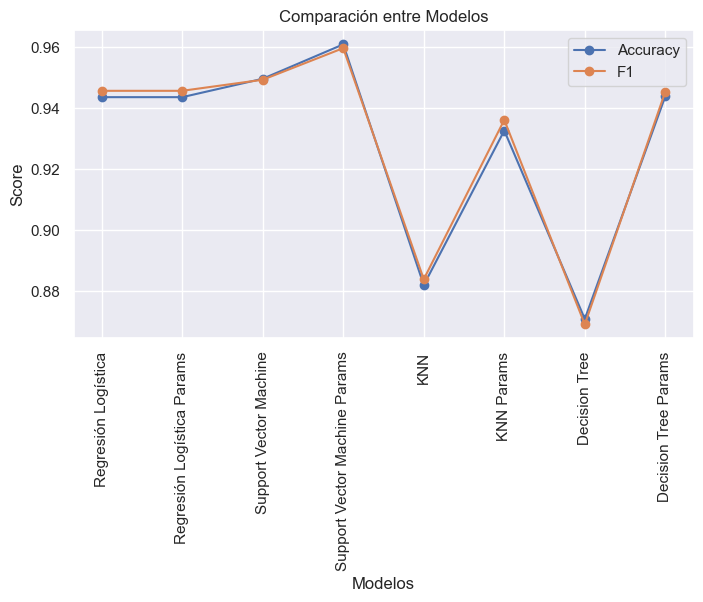

In [115]:
import matplotlib.pyplot as plt

# Extraer los datos de la tabla
modelos = score_comparison['Modelos']
accuracy = score_comparison['Accuracy']
f1 = score_comparison['F1']

# Crear la gráfica de curva de aprendizaje
plt.figure(figsize=(8, 4))
plt.plot(modelos, accuracy, marker='o', label='Accuracy')
plt.plot(modelos, f1, marker='o', label='F1')
plt.xlabel('Modelos')
plt.ylabel('Score')
plt.title('Comparación entre Modelos')
plt.xticks(rotation=90)
plt.legend()
plt.grid(True)
plt.show()


La gráfica de línea reafirma de manera visual los resultados presentados en la tabla de comparación.

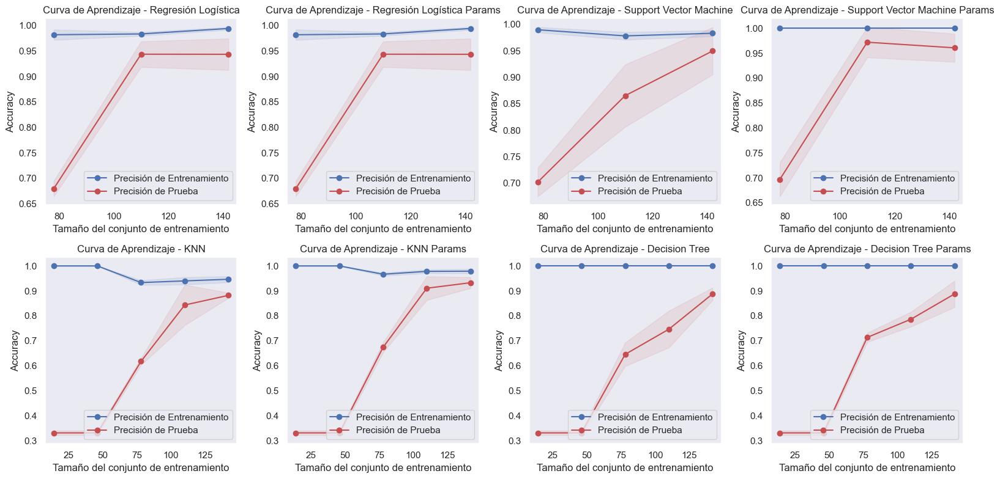

In [116]:
fig, axs = plt.subplots(2, 4, figsize=(16, 8))
axs = axs.flatten()

estimators = [lr, lr_parametros, svc, svc_parametros, knn, knn_parametros, dt, dt_parametros]
model_names = ['Regresión Logística', 'Regresión Logística Params', 'Support Vector Machine', 'Support Vector Machine Params', 'KNN', 'KNN Params', 'Decision Tree', 'Decision Tree Params']

for i, (estimator, model_name) in enumerate(zip(estimators, model_names)):
    plot_learning_curve(estimator, X, y, model_name, axs[i])

plt.tight_layout()
plt.show()

Al observar las gráficas de curva de aprendizaje, podemos confirmar que el **Modelo de Support Vector Machine con Parámetros** aplicados no solo obtiene los mejores resultados en términos de Accuracy y F1, sino que también muestra un rendimiento consistente y equilibrado tanto en los conjuntos de entrenamiento como en los de prueba.

## Ejercicio 5

Aplica algún proceso de ingeniería para mejorar los resultados (normalización, estandarización, muestreo...).

En la etapa de preprocesamiento, se completaron las siguientes tareas:

* Estandarización: Se aplicó el Standard Scaler a la columna **alcalinity_of_ash**, ya que fue la única variable que presentó una distribución normal.

* Normalización: Se aplicó la normalización en dos formas. En primer lugar, se utilizó el MinMax Scaler en las variables sin outliers. En segundo lugar, se aplicó el Robust Scaler en las variables con outliers.

* Muestreo: No fue necesario realizar muestreo, ya que el conjunto de datos utilizado contenía un total de 178 observaciones.